In [3]:
from IPython.display import HTML
from IPython.display import Image
import os

%pylab
%matplotlib inline
%run ../../utils/load_notebook.py

Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib


In [4]:
from photometry import *

importing Jupyter notebook from photometry.ipynb
Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib


In [5]:
from instabilities import *

importing Jupyter notebook from instabilities.ipynb
Using matplotlib backend: Qt5Agg
Populating the interactive namespace from numpy and matplotlib


In [6]:
from utils import *

importing Jupyter notebook from utils.ipynb


In [7]:
def label_line(line, label, x, y, color='0.5', size=12):
    """Add a label to a line, at the proper angle.

    Arguments
    ---------
    line : matplotlib.lines.Line2D object,
    label : str
    x : float
        x-position to place center of text (in data coordinated
    y : float
        y-position to place center of text (in data coordinates)
    color : str
    size : float
    """
    xdata, ydata = line.get_data()
    x1 = xdata[0]
    x2 = xdata[-1]
    y1 = ydata[0]
    y2 = ydata[-1]

    ax = line.get_axes()
    text = ax.annotate(label, xy=(x, y), xytext=(-10, 0),
                       textcoords='offset points',
                       size=size, color=color,
                       horizontalalignment='left',
                       verticalalignment='bottom')

    sp1 = ax.transData.transform_point((x1, y1))
    sp2 = ax.transData.transform_point((x2, y2))

    rise = (sp2[1] - sp1[1])
    run = (sp2[0] - sp1[0])

    slope_degrees = np.degrees(np.arctan2(rise, run))
    text.set_rotation(slope_degrees)
    return text

Пример как работать с моделями:

In [8]:
dictionary = np.load('test_short//models//n1167_modelRmax.npy').tolist()

In [9]:
def plot_data_lim(ax, data_lim):
    '''Вертикальная линия, обозначающая конец данных'''
    ax.axvline(x=data_lim, ls='-.', color='black', alpha=0.5)
    
def plot_disc_scale(scale, ax, text=None):
    '''Обозначает масштаб диска'''
    ax.plot([scale, scale], [0., 0.05], '-', lw=6., color='black')
    if text:
        ax.annotate(text, xy=(scale, 0.025), xytext=(scale, 0.065), textcoords='data', arrowprops=dict(arrowstyle="->"))
        
def plot_Q_levels(ax, Qs, style='--', color='grey', alpha=0.4):
    '''Функция, чтобы рисовать горизонтальные линии различных уровней $Q^{-1}$:'''
    for Q in Qs:
        ax.axhline(y=1./Q, ls=style, color=color, alpha=alpha)
        
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, 
                  star_density_min=None, data_lim=None, color=None, alpha=0.3, disk_scales=[], label=None, **kwargs):
    '''Картинка сравнения 2F и 1F критерия для разных фотометрий и величин sig_R, 
    куда подается весь газ, результат НЕ исправляется за осесимметричные возмущения.'''
    
    Qgs = []
    Qss = []
    invQeff_min = []
    for ind, (r, gd) in enumerate(total_gas_data):
        Qgs.append(Qg(epicycl=epicycl[ind], sound_vel=sound_vel, gas_density=gd))
        Qss.append(Qs(epicycl=epicycl[ind], sigma=sigma_max[ind], star_density=star_density_min[ind]))
        qeff = findInvKinemQeffBrentq(Qss[-1], Qgs[-1], sound_vel/sigma_max[ind], np.arange(0.01, 60000., 1.))
        invQeff_min.append(qeff[1])


    Qgs = []
    Qss = []
    invQeff_max = []
    for ind, (r, gd) in enumerate(total_gas_data):
        Qgs.append(Qg(epicycl=epicycl[ind], sound_vel=sound_vel, gas_density=gd))
        Qss.append(Qs(epicycl=epicycl[ind], sigma=sigma_min[ind], star_density=star_density_max[ind]))
        qeff = findInvKinemQeffBrentq(Qss[-1], Qgs[-1], sound_vel/sigma_min[ind], np.arange(0.01, 60000., 1.))
        invQeff_max.append(qeff[1])
           
    rr = zip(*total_gas_data)[0]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=label)
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6)
    ax.plot(rr, [1./_ for _ in Qgs], 'v-', color='b')

    ax.set_ylim(0., 1.5)
    ax.set_xlim(0., data_lim+50.)
    plot_data_lim(ax, data_lim)
    for h, annot in disk_scales:
        plot_disc_scale(h, ax, annot)
    plot_Q_levels(ax, [1., 1.5, 2., 3.])
    ax.legend()

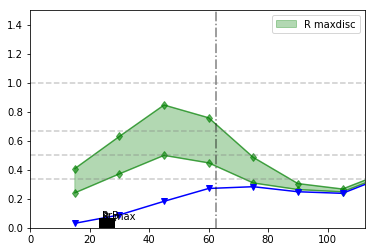

In [10]:
plot_2f_vs_1f_(ax=plt.gca(), **dictionary);

In [11]:
dictionary = np.load('test_short//models//n1167_modelRsubmax.npy').tolist()

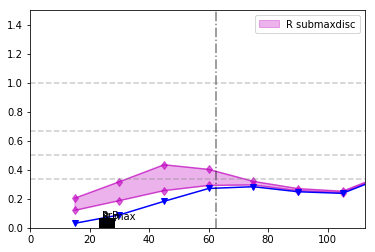

In [12]:
plot_2f_vs_1f_(ax=plt.gca(), **dictionary);

Считываем все модели

In [13]:
models = {}
for model in os.listdir('test_short//models/'):
    if not model[0].startswith('_'):
        models[model[:-4]] = np.load('test_short//models//'+model).tolist()

In [14]:
models.keys()

['n5533_modelRzeroH2',
 'n4725_model36max',
 'n5533_modelr',
 'n1167_modelRsubmax',
 'n338_modelB',
 'n3898_modelRmax',
 'n4725_modelHmax',
 'n3898_modelR2dmax',
 'n2985_modelKmax',
 'n1167_modelRmax',
 'n5533_modelRmax',
 'n2985_model36max',
 'n338_modelR',
 'n4258_model36max',
 'n4258_modelImax']

Ставим классику:

In [15]:
import matplotlib as mpl
mpl.style.use('classic')

Меняем цвета на разные

In [16]:
for ind, model in enumerate(models.keys()):
    models[model]['color'] = cm.rainbow(np.linspace(0, 1, 15))[ind]
    
# swap for better look
models['n4258_model36max']['color'], models['n3898_modelRmax']['color'] = models['n3898_modelRmax']['color'], models['n4258_model36max']['color']

Вычисление $Q$:

In [19]:
def calc_Qs(total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, 
                  star_density_min=None, data_lim=None, color=None, alpha=0.3, disk_scales=[], label=None, sfrange=None, **kwargs):
    
    rr = zip(*total_gas_data)[0]

    Qgs = []
    Qss = []
    invQeff_min = []
    for ind, (r, gd) in enumerate(total_gas_data):
#         print 'r={}'.format(r)
        if type(sound_vel) == list:
            sound_vel_ = sound_vel[ind]
        else:
            sound_vel_ = sound_vel
        Qgs.append(Qg(epicycl=epicycl[ind], sound_vel=sound_vel_, gas_density=gd))
        Qss.append(Qs(epicycl=epicycl[ind], sigma=sigma_max[ind], star_density=star_density_min[ind]))
#         print 'gas_density={}'.format(gd)
#         print 'epicycl={}'.format(epicycl[ind])
#         print 'sigma={}'.format(sigma_max[ind])
#         print 'star_density={}'.format(star_density_min[ind])
#         print 'Qgs={}'.format(Qgs[-1])
#         print 'Qss={}'.format(Qss[-1])
        qeff = findInvKinemQeffBrentq(Qss[-1], Qgs[-1], sound_vel_/sigma_max[ind], np.arange(0.01, 60000., 1.))
        invQeff_min.append(qeff[1])
#         print 'invQeff_min={}'.format(invQeff_min[-1])
        
    invQwff_WS_min = [1./Qg_ + 1./Qs_ for Qg_, Qs_ in zip(Qgs, Qss)]

    Qgs = []
    Qss_max = []
    invQeff_max = []
    for ind, (r, gd) in enumerate(total_gas_data):
        if type(sound_vel) == list:
            sound_vel_ = sound_vel[ind]
        else:
            sound_vel_ = sound_vel
        Qgs.append(Qg(epicycl=epicycl[ind], sound_vel=sound_vel_, gas_density=gd))
        Qss_max.append(Qs(epicycl=epicycl[ind], sigma=sigma_min[ind], star_density=star_density_max[ind]))
        qeff = findInvKinemQeffBrentq(Qss_max[-1], Qgs[-1], sound_vel_/sigma_min[ind], np.arange(0.01, 60000., 1.))
        invQeff_max.append(qeff[1])
        
    invQwff_WS_max = [1./Qg_ + 1./Qs_ for Qg_, Qs_ in zip(Qgs, Qss_max)]
    
    return Qgs, Qss, Qss_max, invQeff_min, invQeff_max, invQwff_WS_min, invQwff_WS_max


for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    Qgs, Qss, Qss_max, invQeff_min, invQeff_max, invQeff_WS_min, invQeff_WS_max = calc_Qs(**model)
    model['Qgs'] = Qgs
    model['Qss_min'] = Qss
    model['Qss_max'] = Qss_max
    model['invQeff_min'] = invQeff_min
    model['invQeff_max'] = invQeff_max
    model['invQeff_WS_min'] = invQeff_WS_min
    model['invQeff_WS_max'] = invQeff_WS_max

n5533_modelRzeroH2
n4725_model36max
n5533_modelr
n1167_modelRsubmax
n338_modelB
n3898_modelRmax
n4725_modelHmax
n3898_modelR2dmax
n2985_modelKmax
n1167_modelRmax
n5533_modelRmax
n2985_model36max
n338_modelR
n4258_model36max
n4258_modelImax


Области звездообразования:

In [20]:
def plot_SF_338(ax):
    ax.plot([5., 60.], [0., 0.], '-', lw=7., color='red')
    
    
def plot_SF_1167(ax):
    ax.plot([16., 40.], [0., 0.], '-', lw=7., color='b') #GALEX
#     ax.plot([55., 80.], [0., 0.], '-', lw=7., color='b') #GALEX
    ax.plot([49., 80.], [0., 0.], '-', lw=7., color='b') #GALEX
#     ax.plot([22., 45.], [0., 0.], '-', lw=7., color='red') #Halpha
    ax.plot([22., 49.], [0., 0.], '-', lw=7., color='red') #Halpha
    
def plot_SF_2985(ax):
    ax.plot([10., 70.], [0., 0.], '-', lw=7., color='b')
    ax.plot([10., 7.2/(0.102*22.4/21.1)], [0., 0.], '-', lw=7., color='r') #TODO: исправить менее грубо
    
def plot_SF_3898(ax):
    ax.plot([70., 80.], [0., 0.], '-', lw=7., color='red')
    ax.plot([190., 210.], [0., 0.], '-', lw=7., color='red')
    ax.plot([0., 70.], [0., 0.], '-', lw=7., color='blue')
    ax.plot([40., 50.], [0., 0.], '-', lw=7., color='blue') #GALEX
    ax.plot([60., 75.], [0., 0.], '-', lw=7., color='blue') #GALEX
    
def plot_SF_4258(ax):
    ax.plot([0., 86./2/(175./600.)], [0., 0.], '-', lw=7., color='b')
    ax.plot([0., 150*58./180.], [0., 0.], '-', lw=7., color='r')
    ax.plot([250./2/(175./600.), 260./2/(175./600.)], [0., 0.], '-', lw=7., color='b') #внешняя спираль
    ax.plot([220./2/(175./600.), 310./2/(175./600.)], [0., 0.], '-', lw=7., color='b') #внешняя спираль, на глаз
    
def plot_SF_4725(ax):
    ax.plot([0., 300./238 * 161./4.], [0., 0.], '-', lw=7., color='red') #очень примерно, потому что в SDSS не видно, но оно там есть
    ax.plot([300./238 * 161./4., 300./238 *268./2.], [0., 0.], '--', lw=6., color='red', alpha=0.5) #в спитцере видно слабое
    ax.plot([300./238 * 161./2., 300./238 *268./2.], [0., 0.], '-', lw=7., color='red')
    ax.plot([290./238 *220., 300./238 *240], [0., 0.], '-', lw=7., color='b') #внешняя спираль, ширина условна
    
def plot_SF_5533(ax):
    ax.plot([10., 95.], [0., 0.], '-', lw=7., color='red')
    ax.plot([58.*(60/149.), 78.*(60/149.)], [0., 0.], '-', lw=7., color='b') #спирали оценил из картинки SDSS с масштабом
    ax.plot([126.*(60/149.), 155.*(60/149.)], [0., 0.], '-', lw=7., color='b')
    ax.plot([204.*(60/149.), 212.*(60/149.)], [0., 0.], '-', lw=7., color='b')
    ax.plot([235.*(60/149.), 250.*(60/149.)], [0., 0.], '-', lw=7., color='b')

SF = {'n338' : plot_SF_338, 'n1167' : plot_SF_1167, 'n2985' : plot_SF_2985, 'n3898' : plot_SF_3898, 'n4258': plot_SF_4258, 'n4725' : plot_SF_4725, 'n5533' : plot_SF_5533}

Полосы и имена:

In [21]:
for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            models[key]['name'] = 'NGC '+name[1:]
            models[key]['band'] = models[key]['label'].split(' ')[0]
            if name == 'n338':
                if key == 'n338_modelR':
                    models[key]['band'] = 'R^{sub}'
                else:
                    models[key]['band'] = 'B^{sub}'
            if name == 'n1167':
                if key == 'n1167_modelRsubmax':
                    models[key]['band'] = 'R^{sub}'
                else:
                    models[key]['band'] = 'R^{max}'
            if key == 'n5533_modelr':
                models[key]['band'] = 'r'
            if key == 'n3898_modelRmax':
                models[key]['band'] = 'R^{N}'
            if key == 'n3898_modelR2dmax':
                models[key]['band'] = 'R^{G}'
            if models[key]['band'] in ['S4G', 'SPITZER']:
                models[key]['band'] = '3.6\mu m'
            if key == 'n5533_modelRzeroH2':
                models[key]['band'] = 'R\,(H_2=0)'

# Qg vs Qs vs Qeff

C:\Anaconda\lib\site-packages\matplotlib\artist.py:233: MatplotlibDeprecationWarning: get_axes has been deprecated in mpl 1.5, please use the
axes property.  A removal date has not been set.
  stacklevel=1)


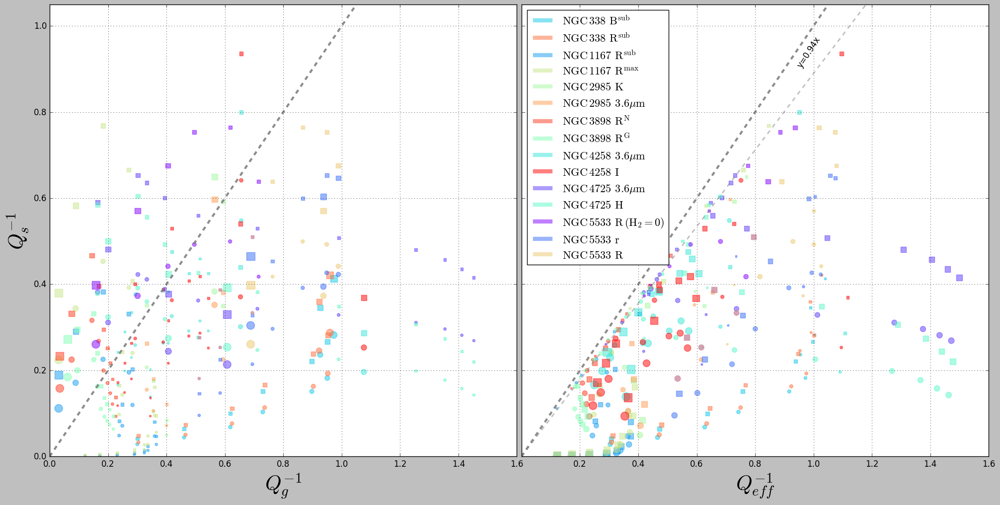

In [22]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 10], sharey=True)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            color = models[key]['color']
            model = models[key]
            
            alpha_ = 0.5
            
            ax.scatter(map(lambda l: 1/l, model['Qgs']), map(lambda l: 1/l, model['Qss_min']), map(lambda l: 2000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax.scatter(map(lambda l: 1/l, model['Qgs']), map(lambda l: 1/l, model['Qss_max']), map(lambda l: 2000./l[0], model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            ax2.scatter(model['invQeff_min'], map(lambda l: 1/l, model['Qss_min']), map(lambda l: l[0]/2., model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax2.scatter(model['invQeff_max'], map(lambda l: 1/l, model['Qss_max']), map(lambda l: l[0]/2., model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            
#             model['Qgs'] = Qgs
#             model['Qss_min'] = Qss
#             model['Qss_max'] = Qss_max
#             model['invQeff_min'] = invQeff_min
#             model['invQeff_max'] = invQeff_max
#             model['invQwff_WS_min'] = invQwff_WS_min
#             model['invQwff_WS_max'] = invQwff_WS_max
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\rm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=6, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\rm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=6, alpha=alpha_)
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 1.6)
ax.set_ylim(0, 1.05)
ax.set_ylabel(r'$Q_{s}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{g}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='upper left', fontsize=16)
ax2.set_xlim(0, 1.6)
# ax2.set_ylim(0, 1.05)
ax2.set_xlabel(r'$Q_{eff}^{-1}$', fontsize=30)
# ax2.set_ylabel(r'$Q_{s}^{-1}$', fontsize=30)
ax2.grid()

# for _ in np.linspace(1., 2., 5):
       
#     line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray')
#     label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
#     line2, = ax.plot([0., 1.0], [0., _], '--', alpha=0.3, color='gray')
#     label_line(line2, 'y={:2.2f}x'.format(_), 0.8/_, 0.8, color='black')
# #     print np.arctan(1./_)*(180./np.pi)
# #     ax.text(0.8*_, 0.8, 'y={}x'.format(_), rotation=np.arctan(1./_)*(180./np.pi))

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=3)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=3)

line, = ax2.plot([0., 2/0.89], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(0.935), 0.9/0.935, 0.9, color='black')

plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)
plt.savefig(paper_imgs_dir+'Qs_vs_Qg_vs_Qeff.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'Qs_vs_Qg_vs_Qeff.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'Qs_vs_Qg_vs_Qeff.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

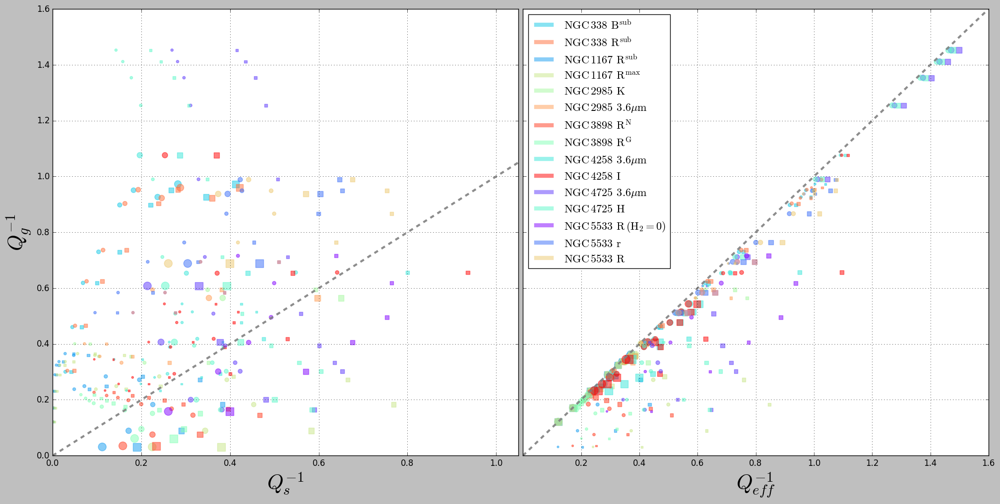

In [23]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 10], sharey=True)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            color = models[key]['color']
            model = models[key]
            
            alpha_ = 0.5
            
            ax.scatter(map(lambda l: 1/l, model['Qss_min']), map(lambda l: 1/l, model['Qgs']), map(lambda l: 2000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax.scatter(map(lambda l: 1/l, model['Qss_max']), map(lambda l: 1/l, model['Qgs']), map(lambda l: 2000./l[0], model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            ax2.scatter(model['invQeff_min'], map(lambda l: 1/l, model['Qgs']), map(lambda l: l[0]/2., model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax2.scatter(model['invQeff_max'], map(lambda l: 1/l, model['Qgs']), map(lambda l: l[0]/2., model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            
#             model['Qgs'] = Qgs
#             model['Qss_min'] = Qss
#             model['Qss_max'] = Qss_max
#             model['invQeff_min'] = invQeff_min
#             model['invQeff_max'] = invQeff_max
#             model['invQwff_WS_min'] = invQwff_WS_min
#             model['invQwff_WS_max'] = invQwff_WS_max
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\rm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=6, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\rm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=6, alpha=alpha_)
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 1.05)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{g}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{s}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='upper left', fontsize=16)
ax2.set_xlim(0, 1.6)
# ax2.set_ylim(0, 1.05)
ax2.set_xlabel(r'$Q_{eff}^{-1}$', fontsize=30)
# ax2.set_ylabel(r'$Q_{s}^{-1}$', fontsize=30)
ax2.grid()

# for _ in np.linspace(1., 2., 5):
       
#     line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray')
#     label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
#     line2, = ax.plot([0., 1.0], [0., _], '--', alpha=0.3, color='gray')
#     label_line(line2, 'y={:2.2f}x'.format(_), 0.8/_, 0.8, color='black')
# #     print np.arctan(1./_)*(180./np.pi)
# #     ax.text(0.8*_, 0.8, 'y={}x'.format(_), rotation=np.arctan(1./_)*(180./np.pi))

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=3)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=3)

# line, = ax2.plot([0., 2/0.89], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
# label_line(line, 'y={:2.2f}x'.format(0.935), 0.9/0.935, 0.9, color='black')

plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)
# plt.savefig(paper_imgs_dir+'Qs_vs_Qg_vs_Qeff.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qs_vs_Qg_vs_Qeff.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qs_vs_Qg_vs_Qeff.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

# Qeff vs Q_WS vs Q_RF

Подготовка

In [24]:
for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    model['r_g_dens'] = zip(*model['total_gas_data'])[0]
    model['HI_gas_dens'] = [l[0][1]/He_coeff - l[1] for l in zip(model['total_gas_data'], model['CO'])]
    model['CO_gas_dens'] = model['CO']
    model['star_density'] = model['star_density_min']
    model['sigma_R_max'] = model['sigma_max']
    model['sigma_R_min'] = model['sigma_min']
    model['sound_vel_CO'] = model['sound_vel']
    model['sound_vel_HI'] = model['sound_vel']

n5533_modelRzeroH2
n4725_model36max
n5533_modelr
n1167_modelRsubmax
n338_modelB
n3898_modelRmax
n4725_modelHmax
n3898_modelR2dmax
n2985_modelKmax
n1167_modelRmax
n5533_modelRmax
n2985_model36max
n338_modelR
n4258_model36max
n4258_modelImax


In [25]:
from math import pi

def romeo_Qinv(r=None, epicycl=None, sound_vel=None, sound_vel_CO=6., sound_vel_HI=11., sigma_R=None, star_density=None, 
               HI_density=None, CO_density=None, alpha=None, verbose=False, thin=True, He_corr=False):
    '''Возвращает приближение Q из Romeo&Falstad(2013), оно же трехкомпонентное Romeo&Wiegert(2011) и наиболее неустойчивую компоненту.'''
    G = 4.32
    kappa = epicycl
    
    if not He_corr:
        CO_density = He_coeff*CO_density
        HI_density = He_coeff*HI_density
    if sound_vel is not None:
        sound_vel_CO=sound_vel
        sound_vel_HI=sound_vel
        
    Q_star = kappa*sigma_R/(pi*G*star_density) # не 3.36
    Q_CO = kappa*sound_vel_CO/(pi*G*CO_density)
    Q_HI = kappa*sound_vel_HI/(pi*G*HI_density)
    if not thin:
        T_CO, T_HI = 1.5, 1.5
        if alpha > 0 and alpha <= 0.5:
            T_star = 1. + 0.6*alpha**2
        else:
            T_star = 0.8 + 0.7*alpha
    else:
        T_CO, T_HI, T_star = 1., 1., 1.
    dispersions = [sigma_R, sound_vel_HI, sound_vel_CO]
    QTs = [Q_star*T_star, Q_HI*T_HI, Q_CO*T_CO]
    components = ['star', 'HI', 'H2']
    mindex = QTs.index(min(QTs))
    
    if verbose:
        print 'QTs: {}'.format(QTs)
        print 'min index: {}'.format(mindex)
        print 'min component: {}'.format(components[mindex])
    
    sig_m = dispersions[mindex]
    def W_i(sig_m, sig_i):
        return 2*sig_m*sig_i/(sig_m**2 + sig_i**2)
    
    if verbose:
        print 'Ws/TQs={:5.3f} WHI/TQHI={:5.3f} WCO/TQCO={:5.3f}'.format(W_i(sig_m, dispersions[0])/QTs[0], W_i(sig_m, dispersions[1])/QTs[1], W_i(sig_m, dispersions[2])/QTs[2])
        print 'Ws={:5.3f} WHI={:5.3f} WCO={:5.3f}'.format(W_i(sig_m, dispersions[0]), W_i(sig_m, dispersions[1]), W_i(sig_m, dispersions[2]))
    
    return W_i(sig_m, dispersions[0])/QTs[0] + W_i(sig_m, dispersions[1])/QTs[1] + W_i(sig_m, dispersions[2])/QTs[2], components[mindex]

In [28]:
def plot_RF13_vs_2F(r_g_dens=None, HI_gas_dens=None, CO_gas_dens=None, epicycl=None, sound_vel_CO=6., sound_vel_HI=11., sound_vel=None, sigma_R_max=None, sigma_R_min=None,  
           star_density=None, alpha_max=None, alpha_min=None, thin=True, verbose=False, scale=None, gas_approx=None, invQeff_min=None, invQeff_max=None, **kwargs):
    '''Плотности газа передаются не скорр. за гелий.'''
           
    fig = plt.figure(figsize=[20, 5])
    ax = plt.subplot(131)
    
    totgas = zip(r_g_dens, [He_coeff*(l[0]+l[1]) for l in zip(HI_gas_dens, CO_gas_dens)])[1:]
    
    if sound_vel is not None:
        sound_vel_CO=sound_vel
        sound_vel_HI=sound_vel
    
    if verbose:
        print 'sig_R_max case:'
    romeo_min = []
    for ind, (r, g, co) in enumerate(zip(r_g_dens, HI_gas_dens, CO_gas_dens)):
        rom, _ = romeo_Qinv(r=r, epicycl=epicycl[ind], sound_vel=sound_vel, sigma_R=sigma_R_max[ind], 
               star_density=star_density[ind], HI_density=He_coeff*g, CO_density=He_coeff*co, 
                         alpha=alpha_min, verbose=False, He_corr=True, thin=thin)
        romeo_min.append(rom)
        if _ == 'star':
            color = 'g' 
        elif _ == 'HI':
            color = 'b'
        else:
            color = 'm'
        ax.scatter(r, rom, 10, marker='o', color=color)


#     invQg, invQs, invQeff_min = zip(*get_invQeff_from_data(gas_data=totgas, 
#                                     epicycl=epicycl[ind], 
#                                     gas_approx=gas_approx,
#                                     sound_vel=sound_vel, 
#                                     scale=scale,
#                                     sigma=sigma_R_max,
#                                     star_density=star_density[ind]))

    if verbose:
        print 'sig_R_min case:'
    
    romeo_max = []
    for ind, (r, g, co) in enumerate(zip(r_g_dens, HI_gas_dens, CO_gas_dens)):
        rom, _ = romeo_Qinv(r=r, epicycl=epicycl[ind], sound_vel=sound_vel, sigma_R=sigma_R_min[ind], 
               star_density=star_density[ind], HI_density=He_coeff*g, CO_density=He_coeff*co, 
                         alpha=alpha_max, verbose=False, He_corr=True, thin=thin)
        romeo_max.append(rom)
        if _ == 'star':
            color = 'g' 
        elif _ == 'HI':
            color = 'b'
        else:
            color = 'm'
        ax.scatter(r, rom, 10, marker = 's', color=color)


#     invQg, invQs, invQeff_max = zip(*get_invQeff_from_data(gas_data=totgas, 
#                                     epicycl=epicycl, 
#                                     gas_approx=gas_approx,
#                                     sound_vel=sound_vel, 
#                                     scale=scale,
#                                     sigma=sigma_R_min,
#                                     star_density=star_density))

    ax.plot(r_g_dens, invQeff_min, '-', alpha=0.5, color='r')
    ax.plot(r_g_dens, invQeff_max, '-', alpha=0.5, color='r')
    
    plot_Q_levels(ax, [1., 1.5, 2., 3.])
    ax.set_xlim(0)
    ax.set_ylim(0)
    ax.legend([matplotlib.lines.Line2D([0], [0], linestyle='none', mfc='g', mec='none', marker='o'), 
                      matplotlib.lines.Line2D([0], [0], linestyle='none', mfc='b', mec='none', marker='o'), 
                      matplotlib.lines.Line2D([0], [0], linestyle='none', mfc='m', mec='none', marker='o')], 
                     ['star', 'HI', 'H2'], numpoints=1, markerscale=1, loc='upper right') #add custom legend
    ax.set_title('RF13: major component')
    
    ax = plt.subplot(132)
    ax.plot(romeo_min, invQeff_min, 'o')
    ax.plot(romeo_max, invQeff_max, 'o', color='m', alpha=0.5)
    ax.set_xlabel('Romeo')
    ax.set_ylabel('2F')
    ax.set_xlim(0., 1.)
    ax.set_ylim(0., 1.)
    ax.plot(ax.get_xlim(), ax.get_ylim(), '--')
    
    ax = plt.subplot(133)
    ax.plot(r_g_dens, [l[1]/l[0] for l in zip(romeo_min, invQeff_min)], 'o-')
    ax.plot(r_g_dens, [l[1]/l[0] for l in zip(romeo_max, invQeff_max)], 'o-', color='m', alpha=0.5)
    ax.set_xlabel('R')
    ax.set_ylabel('[2F]/[Romeo]')
    ax.set_xlim(0., 130.);

n5533_modelRzeroH2


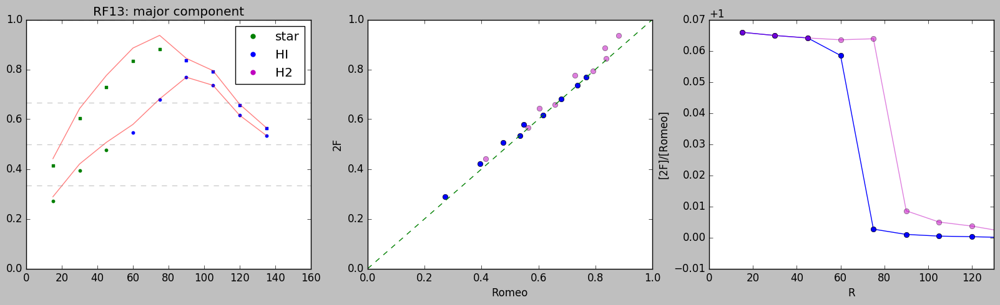

n4725_model36max


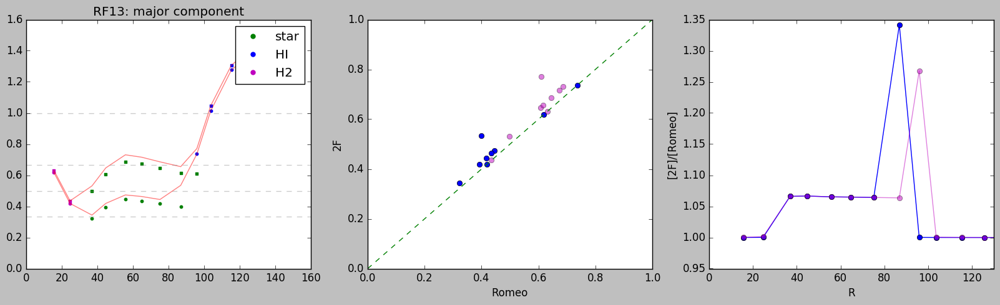

n5533_modelr


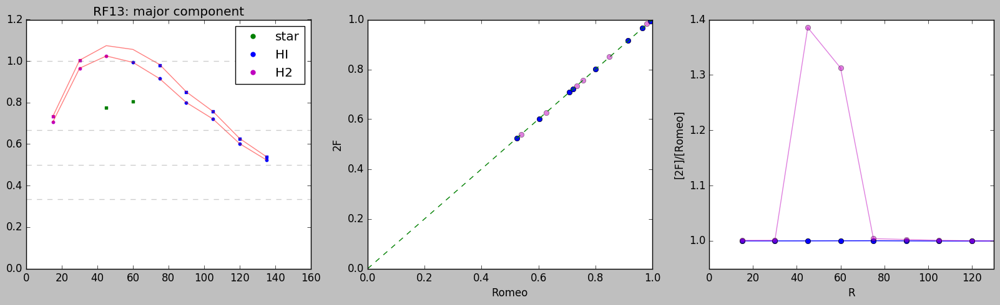

n1167_modelRsubmax


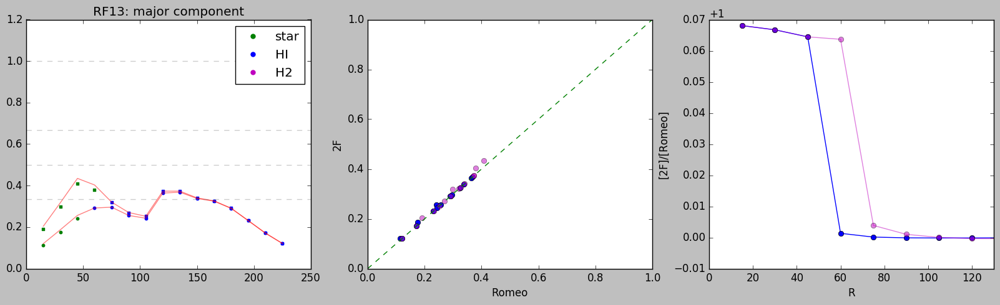

n338_modelB


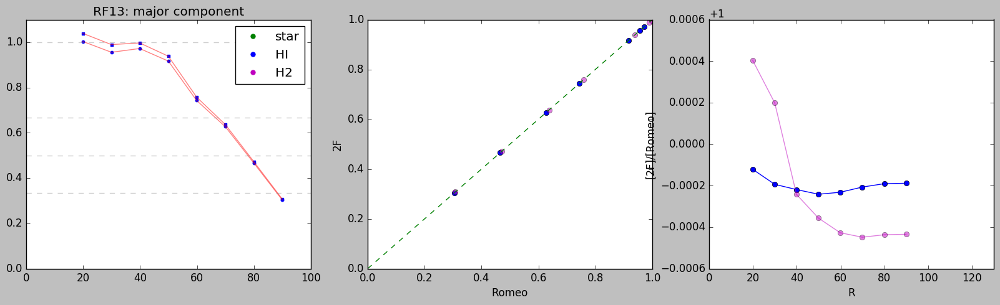

n3898_modelRmax


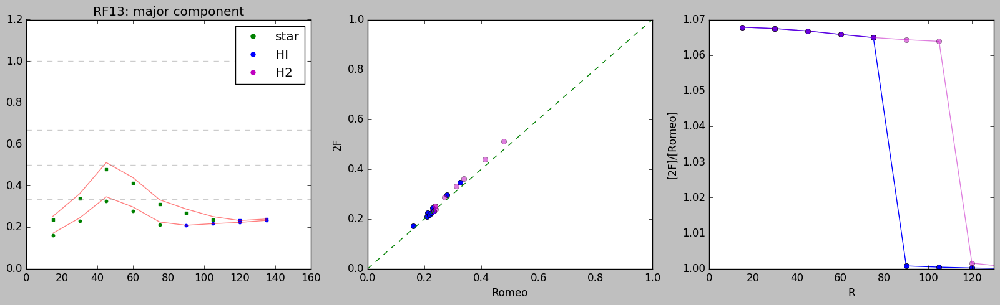

n4725_modelHmax


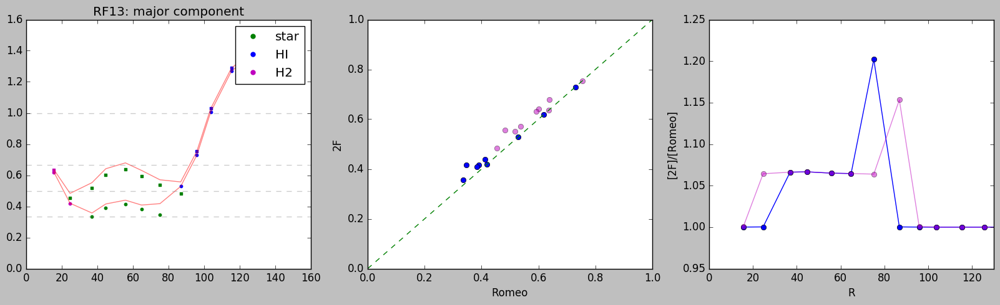

n3898_modelR2dmax


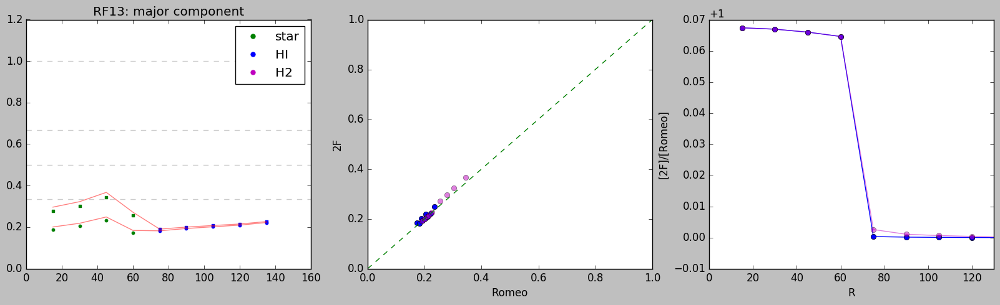

n2985_modelKmax


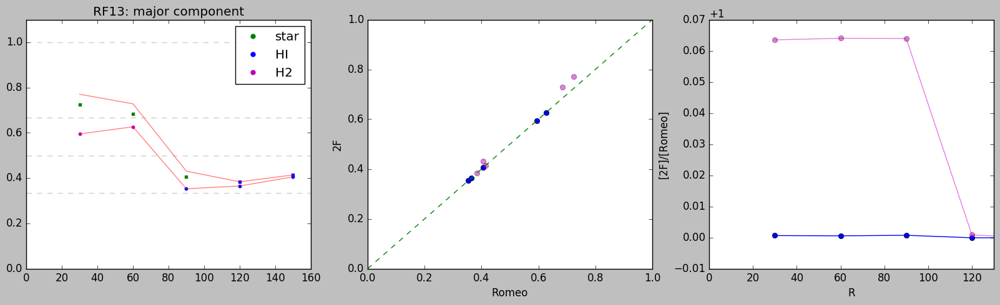

n1167_modelRmax


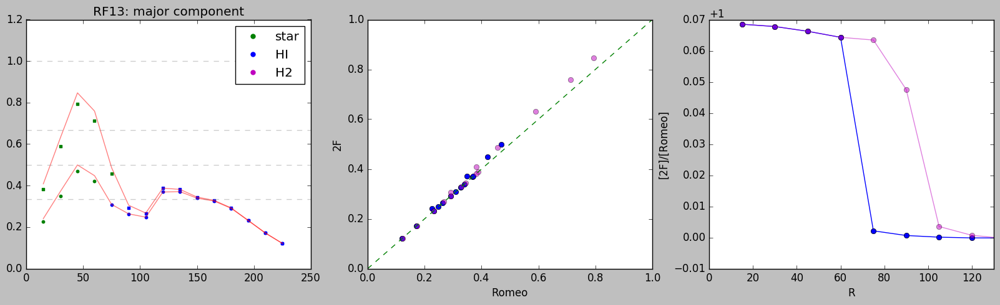

n5533_modelRmax


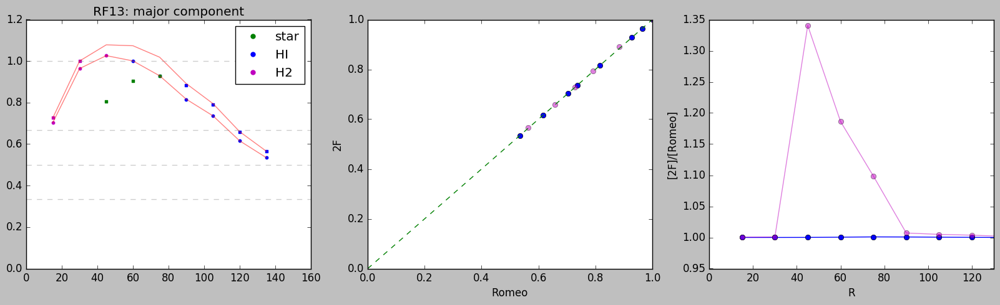

n2985_model36max


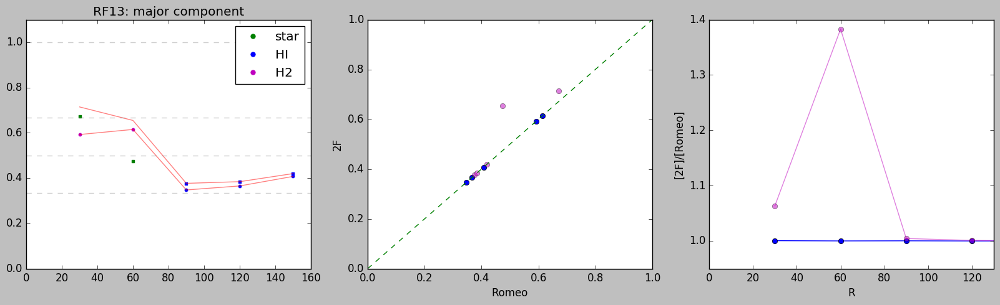

n338_modelR


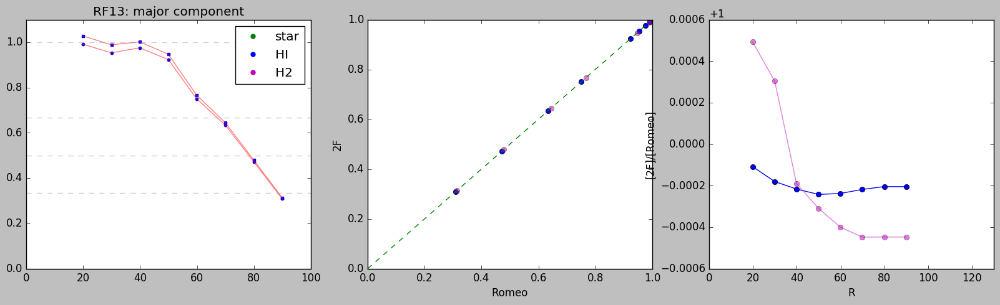

n4258_model36max


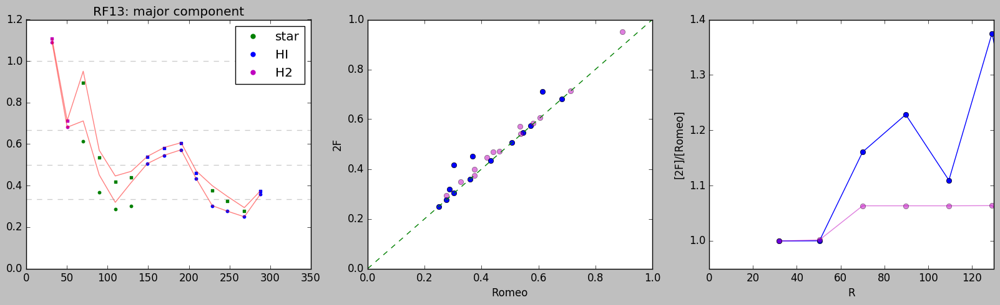

n4258_modelImax


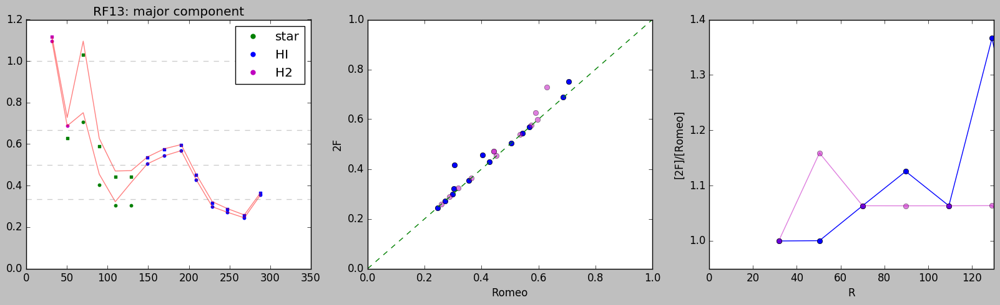

In [29]:
for ind, key in enumerate(models.keys()):
    print key
    model = models[key]   
    plot_RF13_vs_2F(r_g_dens=model['r_g_dens'], HI_gas_dens=model['HI_gas_dens'], CO_gas_dens=model['CO_gas_dens'], 
                epicycl=model['epicycl'], sound_vel=model['sound_vel'], sigma_R_max=model['sigma_R_max'], sigma_R_min=model['sigma_R_min'],  
                star_density=model['star_density'], 
                alpha_max=0.7, alpha_min=0.3, scale=model['scale'], gas_approx=model['gas_approx'], thin=True, invQeff_min=model['invQeff_min'], invQeff_max=model['invQeff_max'])
#     plot_RF13_vs_2F(alpha_max=0.7, alpha_min=0.3, thin=True, **model)
    plt.show()

In [55]:

from math import pi

def romeo_Qinv(r=None, epicycl=None, sound_vel_CO=6., sound_vel_HI=11., sigma_R=None, star_density=None, 
               HI_density=None, CO_density=None, alpha=None, verbose=False, thin=True, He_corr=False):
    '''Возвращает приближение Q из Romeo&Falstad(2013), оно же трехкомпонентное Romeo&Wiegert(2011) и наиболее неустойчивую компоненту.'''
    G = 4.32
    kappa = epicycl
    
    if not He_corr:
        CO_density = He_coeff*CO_density
        HI_density = He_coeff*HI_density
        
    Q_star = kappa*sigma_R/(pi*G*star_density) # не 3.36
    Q_CO = kappa*sound_vel_CO/(pi*G*CO_density)
    Q_HI = kappa*sound_vel_HI/(pi*G*HI_density)
    if not thin:
        T_CO, T_HI = 1.5, 1.5
        if alpha > 0 and alpha <= 0.5:
            T_star = 1. + 0.6*alpha**2
        else:
            T_star = 0.8 + 0.7*alpha
    else:
        T_CO, T_HI, T_star = 1., 1., 1.
    dispersions = [sigma_R, sound_vel_HI, sound_vel_CO]
    QTs = [Q_star*T_star, Q_HI*T_HI, Q_CO*T_CO]
    components = ['star', 'HI', 'H2']
    mindex = QTs.index(min(QTs))
    
    if verbose:
        print 'QTs: {}'.format(QTs)
        print 'min index: {}'.format(mindex)
        print 'min component: {}'.format(components[mindex])
    
    sig_m = dispersions[mindex]
    def W_i(sig_m, sig_i):
        return 2*sig_m*sig_i/(sig_m**2 + sig_i**2)
    
    if verbose:
        print 'Ws/TQs={:5.3f} WHI/TQHI={:5.3f} WCO/TQCO={:5.3f}'.format(W_i(sig_m, dispersions[0])/QTs[0], W_i(sig_m, dispersions[1])/QTs[1], W_i(sig_m, dispersions[2])/QTs[2])
        print 'Ws={:5.3f} WHI={:5.3f} WCO={:5.3f}'.format(W_i(sig_m, dispersions[0]), W_i(sig_m, dispersions[1]), W_i(sig_m, dispersions[2]))
    
    return W_i(sig_m, dispersions[0])/QTs[0] + W_i(sig_m, dispersions[1])/QTs[1] + W_i(sig_m, dispersions[2])/QTs[2], components[mindex]


def romeo_Qinv2(r=None, epicycl=None, sound_vel=None, sigma_R=None, star_density=None, 
               HI_density=None, CO_density=None, alpha=None, verbose=False, thin=True, He_corr=False, **kwargs):
    '''Возвращает приближение Q из Romeo&Falstad(2013), оно же трехкомпонентное Romeo&Wiegert(2011) и наиболее неустойчивую компоненту.'''
    G = 4.32
    kappa = epicycl
    
    if not He_corr:
        CO_density_ = He_coeff*CO_density
        HI_density_ = He_coeff*HI_density
    else:
        CO_density_ = CO_density
        HI_density_ = HI_density
    
    gas = CO_density_ + HI_density_
    Q_star = kappa*sigma_R/(pi*G*star_density) # не 3.36
    Q_g = kappa*sound_vel/(pi*G*gas)
    if not thin:
        T_g = 1.5
        if alpha > 0 and alpha <= 0.5:
            T_star = 1. + 0.6*alpha**2
        else:
            T_star = 0.8 + 0.7*alpha
    else:
        T_g, T_star = 1., 1.
    dispersions = [sigma_R, sound_vel]
    QTs = [Q_star*T_star, Q_g*T_g]
    components = ['star', 'gas']
    mindex = QTs.index(min(QTs))
    
    if verbose:
        print 'QTs: {}'.format(QTs)
        print 'min index: {}'.format(mindex)
        print 'min component: {}'.format(components[mindex])
    
    sig_m = dispersions[mindex]
    def W_i(sig_m, sig_i):
        return 2*sig_m*sig_i/(sig_m**2 + sig_i**2)
    
#     if verbose:
#         print 'Ws/TQs={:5.3f} WHI/TQHI={:5.3f} WCO/TQCO={:5.3f}'.format(W_i(sig_m, dispersions[0])/QTs[0], W_i(sig_m, dispersions[1])/QTs[1], W_i(sig_m, dispersions[2])/QTs[2])
#         print 'Ws={:5.3f} WHI={:5.3f} WCO={:5.3f}'.format(W_i(sig_m, dispersions[0]), W_i(sig_m, dispersions[1]), W_i(sig_m, dispersions[2]))
    
    return W_i(sig_m, dispersions[0])/QTs[0] + W_i(sig_m, dispersions[1])/QTs[1], components[mindex]

def calc_romeo_Q(r_g_dens=None, HI_gas_dens=None, CO_gas_dens=None, epicycl=None, sound_vel=None, sound_vel_CO=6., sound_vel_HI=11., sigma_R_max=None, sigma_R_min=None,  
           star_density=None, alpha_max=None, alpha_min=None, scale=None, gas_approx=None, thin=True, show=False, color=None, **kwargs):    
            
    totgas = zip(r_g_dens, [He_coeff*(l[0]+l[1]) for l in zip(HI_gas_dens, CO_gas_dens)])

    romeo_min = []
    for ind, (r, g, co) in enumerate(zip(r_g_dens, HI_gas_dens, CO_gas_dens)):
        rom, _ = romeo_Qinv2(r=r, epicycl=epicycl[ind], sound_vel_CO=sound_vel, sound_vel_HI=sound_vel, sigma_R=sigma_R_max[ind], 
               star_density=star_density[ind], HI_density=He_coeff*g, CO_density=He_coeff*co, alpha=alpha_min, thin=thin, sound_vel=sound_vel, He_corr=True)
        romeo_min.append(rom)

    
    romeo_max = []
    for ind, (r, g, co) in enumerate(zip(r_g_dens, HI_gas_dens, CO_gas_dens)):
        rom, _ = romeo_Qinv2(r=r, epicycl=epicycl[ind], sound_vel_CO=sound_vel, sound_vel_HI=sound_vel, sigma_R=sigma_R_min[ind], 
               star_density=star_density[ind], HI_density=He_coeff*g, CO_density=He_coeff*co, alpha=alpha_max, thin=thin, sound_vel=sound_vel, He_corr=True)
        romeo_max.append(rom)
    
    return romeo_min, romeo_max


for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    romeo_min, romeo_max = calc_romeo_Q(alpha_max=0.7, alpha_min=0.3, **model)
    model['romeo_min'] = romeo_min
    model['romeo_max'] = romeo_max

n5533_modelRzeroH2
n4725_model36max
n5533_modelr
n1167_modelRsubmax
n338_modelB
n3898_modelRmax
n4725_modelHmax
n3898_modelR2dmax
n2985_modelKmax
n1167_modelRmax
n5533_modelRmax
n2985_model36max
n338_modelR
n4258_model36max
n4258_modelImax


n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


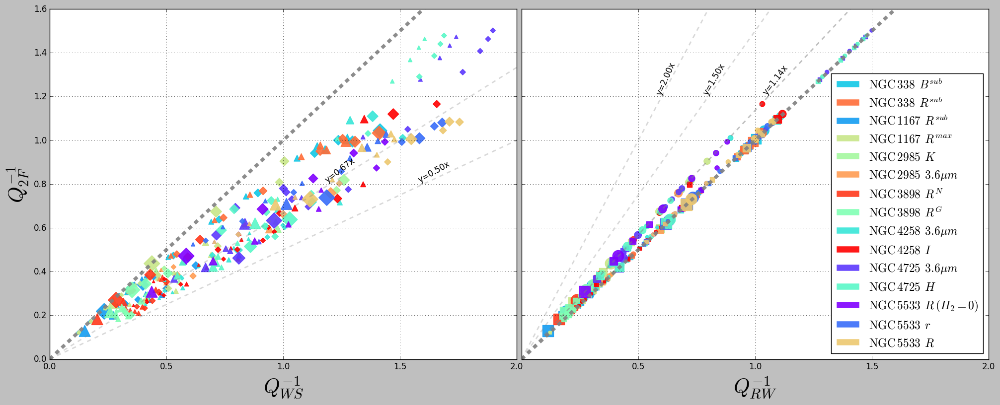

In [56]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            romeo_min = model['romeo_min']
            romeo_max = model['romeo_max']
            
            invQwff_WS_min = model['invQeff_WS_min']
            invQwff_WS_max = model['invQeff_WS_max']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.9
            
            ax2.scatter(romeo_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            ax2.scatter(romeo_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax.scatter(invQwff_WS_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='^', color=color, alpha=alpha_)
            ax.scatter(invQwff_WS_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='D', color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{WS}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
# ax2.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW}^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1.5, 2., 2):
       
    line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.88), 1.2*0.88, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

# plt.savefig(paper_imgs_dir+'Qeff_vs_QWS_vs_QRF.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QWS_vs_QRF.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QWS_vs_QRF.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

Одинаковые маркеры для верхней и нижней оценки:

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


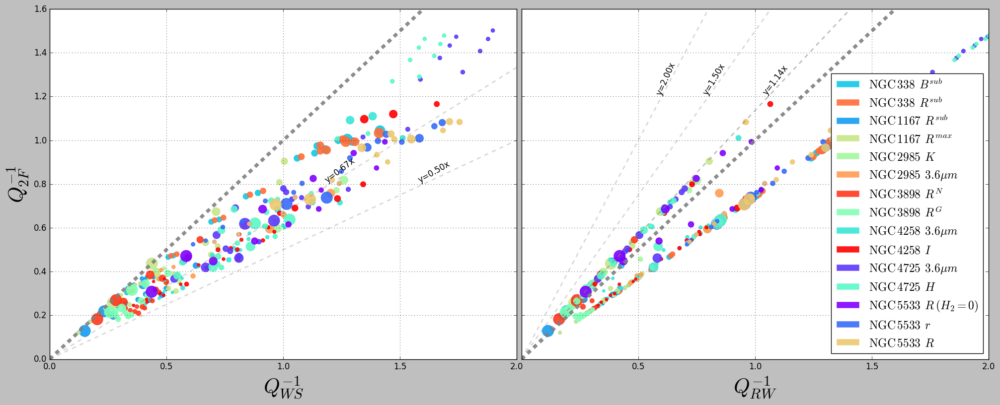

In [46]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            romeo_min = model['romeo_min']
            romeo_max = model['romeo_max']
            
            invQwff_WS_min = model['invQeff_WS_min']
            invQwff_WS_max = model['invQeff_WS_max']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.9
            
            ax2.scatter(romeo_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax2.scatter(romeo_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax.scatter(invQwff_WS_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax.scatter(invQwff_WS_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{WS}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
# ax2.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW}^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1.5, 2., 2):
       
    line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.88), 1.2*0.88, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

plt.savefig(paper_imgs_dir+'Qeff_vs_QWS_vs_QRF.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'Qeff_vs_QWS_vs_QRF.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'Qeff_vs_QWS_vs_QRF.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

Неполные маркеры:

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


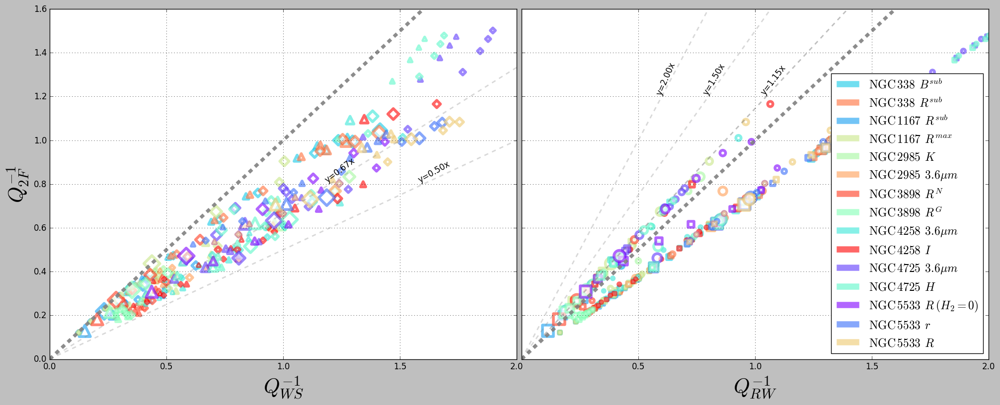

In [95]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            romeo_min = model['romeo_min']
            romeo_max = model['romeo_max']
            
            invQwff_WS_min = model['invQeff_WS_min']
            invQwff_WS_max = model['invQeff_WS_max']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.6
            
            ax2.scatter(romeo_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='s', color='w', alpha=alpha_, linewidth=4, 
                        edgecolors=matplotlib.colors.colorConverter.to_rgba(color, alpha=alpha_))
            ax2.scatter(romeo_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color='w', alpha=alpha_, linewidth=4, 
                        edgecolors=matplotlib.colors.colorConverter.to_rgba(color, alpha=alpha_))
            ax.scatter(invQwff_WS_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='^', color='w', alpha=alpha_, linewidth=4, 
                       edgecolors=matplotlib.colors.colorConverter.to_rgba(color, alpha=alpha_))
            ax.scatter(invQwff_WS_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='D', color='w', alpha=alpha_, linewidth=4, 
                       edgecolors=matplotlib.colors.colorConverter.to_rgba(color, alpha=alpha_))
            
#             ax2.loglog(romeo_min, invQeff_min, 's', color=color, alpha=alpha_)
#             ax2.loglog(romeo_max, invQeff_max, 'o', color=color, alpha=alpha_)
#             ax.loglog(invQwff_WS_min, invQeff_min, '^', color=color, alpha=alpha_)
#             ax.loglog(invQwff_WS_max, invQeff_max, 'D', color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{WS}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
# ax2.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW}^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1.5, 2., 2):
       
    line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.873*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.873), 1.2*0.873, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

plt.show()

Влияние толщины и разных дисперсий:

In [96]:
for ind, key in enumerate(models.keys()):
    model = models[key]
    romeo_min, romeo_max = calc_romeo_Q(alpha_max=0.7, alpha_min=0.3, thin=False, **model)
    model['romeo_min_h'] = romeo_min
    model['romeo_max_h'] = romeo_max

In [97]:
for ind, key in enumerate(models.keys()):
    model = models[key]
    model['sound_vel_CO'] = 6.
    model['sound_vel_HI'] = 11.
    romeo_min, romeo_max = calc_romeo_Q(alpha_max=0.7, alpha_min=0.3, thin=True, **model)
    model['romeo_min_11'] = romeo_min
    model['romeo_max_11'] = romeo_max

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


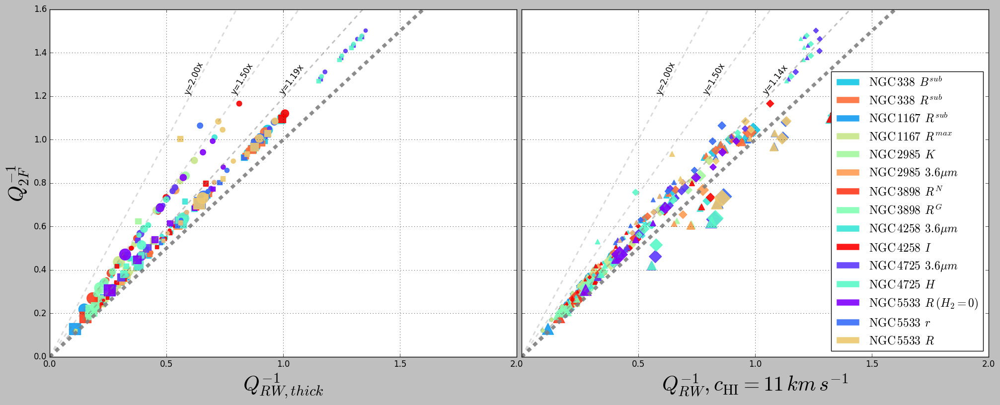

In [98]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
# for ind, name in enumerate(['n338']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            romeo_min_h = model['romeo_min_h']
            romeo_max_h = model['romeo_max_h']
            
            romeo_min_11 = model['romeo_min_11']
            romeo_max_11 = model['romeo_max_11']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.9
            
            ax.scatter(romeo_min_h, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            ax.scatter(romeo_max_h, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='o', color=color, alpha=alpha_)
            ax2.scatter(romeo_min_11, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='^', color=color, alpha=alpha_)
            ax2.scatter(romeo_max_11, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='D', color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{RW, thick}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
# ax2.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW}^{-1},c_{\rm{HI}}=11\,km\,s^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1.5, 2., 2):
       
#     line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
#     label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')
    
    line1, = ax.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line1, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.88), 1.2*0.88, 1.2, color='black')

T_07 = 1.05

line, = ax.plot([0., 1/T_07 * 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(T_07/0.88), 1.2*0.88/T_07, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

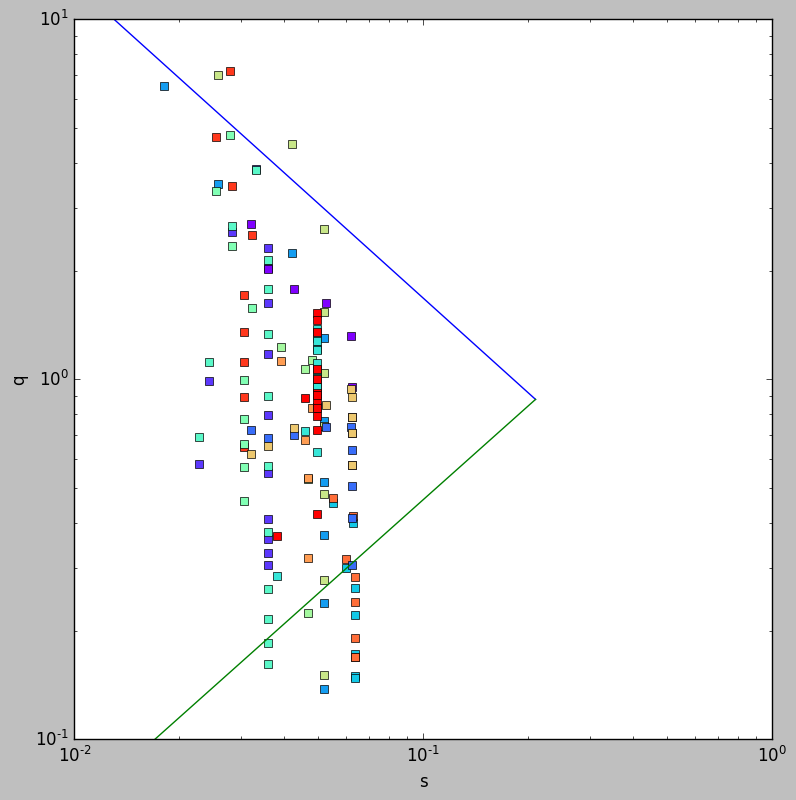

In [99]:
fig = plt.figure(figsize=[9,9])
ax = plt.gca()

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
#             print key
            model = models[key]
#             plt.plot([model['sound_vel']/l for l in model['sigma_R_min']], [l[0]/l[1] for l in zip(model['Qgs'], model['Qss_min'])], '.', color=model['color'])
            plt.plot([model['sound_vel']/l for l in model['sigma_R_max']], [l[0]/l[1] for l in zip(model['Qgs'], model['Qss_max'])], 's', color=model['color'])
#             print model.keys()

plt.plot([0.013, 0.21], [10., 0.88], '-')
plt.plot([0.017, 0.21], [0.1, 0.88], '-')

plt.ylim(0.1, 10.)
plt.xlim(0.01, 1.)
plt.xlabel('s')
plt.ylabel('q')
ax.set_xscale("log", nonposx='clip')
ax.set_yscale("log", nonposy='clip');

In [100]:
for ind, key in enumerate(models.keys()):
    model = models[key]
    model['sound_vel_CO'] = 6.
    model['sound_vel_HI'] = 11.
    print '============='
    print key
    print '============='
    romeo_min = []
    fiducial = []
    mincomp = []
    for ind, (r, g, co) in enumerate(zip(model['r_g_dens'], model['HI_gas_dens'], model['CO_gas_dens'])):
        print 'r={:5.3f}'.format(r)
        rom, _ = romeo_Qinv(r=r, epicycl=model['epicycl'][ind], sound_vel_CO=6., sound_vel_HI=11., sigma_R=(model['sigma_R_max'][ind]+model['sigma_R_min'][ind])/2., 
               star_density=model['star_density'][ind], HI_density=He_coeff*g, CO_density=He_coeff*co, alpha=0.5, thin=False, verbose=False, He_corr=True)
        fiducial.append(rom)
        mincomp.append(_)
        print 'Qs={:5.3f}//{:5.3f} Qg={:5.3f} Qeff={:5.3f}//{:5.3f}'.format(model['Qss_min'][ind], model['Qss_max'][ind], 
                                                                            model['Qgs'][ind], 1./model['invQeff_min'][ind], 1./model['invQeff_max'][ind])
    model['fiducialQ'] = fiducial
    model['mincomp'] = mincomp

n5533_modelRzeroH2
r=15.000
QTs: [3.648965835922529, 17.424462490584677, 4970.7239359504292]
min index: 0
min component: star
Ws/TQs=0.274 WHI/TQHI=0.008 WCO/TQCO=0.000
Ws=1.000 WHI=0.141 WCO=0.077
Qs=3.588//2.345 Qg=6.324 Qeff=3.248//2.123
r=30.000
QTs: [2.5482461966394112, 9.1549111765348847, 2506.7811330657341]
min index: 0
min component: star
Ws/TQs=0.392 WHI/TQHI=0.017 WCO/TQCO=0.000
Ws=1.000 WHI=0.158 WCO=0.086
Qs=2.506//1.638 Qg=3.322 Qeff=2.232//1.459
r=45.000
QTs: [2.1522447115686063, 6.8033034359482434, 1632.7928246275783]
min index: 0
min component: star
Ws/TQs=0.465 WHI/TQHI=0.028 WCO/TQCO=0.000
Ws=1.000 WHI=0.188 WCO=0.103
Qs=2.116//1.383 Qg=2.468 Qeff=1.853//1.211
r=60.000
QTs: [1.9306266238772409, 5.5653887296108282, 1168.7316332182741]
min index: 0
min component: star
Ws/TQs=0.518 WHI/TQHI=0.041 WCO/TQCO=0.000
Ws=1.000 WHI=0.230 WCO=0.127
Qs=1.899//1.241 Qg=2.019 Qeff=1.624//1.062
r=75.000
QTs: [1.9039694012804425, 4.4634686238724921, 878.89754902798347]
min index: 0
mi

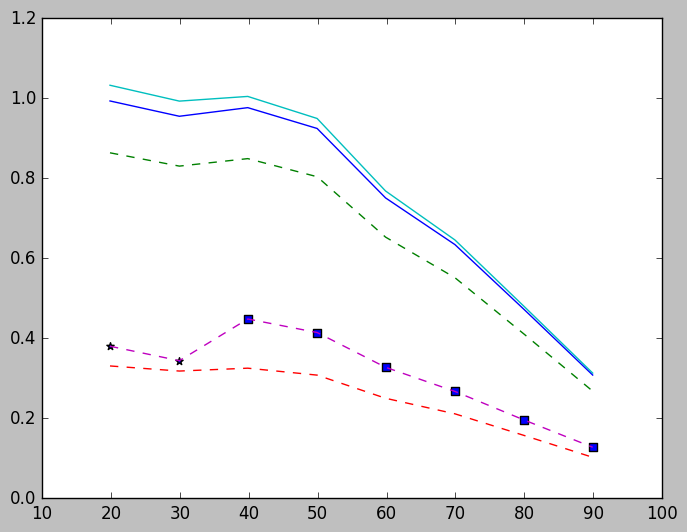

In [101]:
model = models['n338_modelR']
plt.plot(model['r_g_dens'], model['invQeff_min'], '-')

plt.plot(model['r_g_dens'], np.array(model['invQeff_min'])/1.15, '--')
plt.plot(model['r_g_dens'], np.array(model['invQeff_min'])/3., '--')

plt.plot(model['r_g_dens'], model['invQeff_max'], '-')
plt.plot(model['r_g_dens'], model['fiducialQ'], '--')
for ind, comp in enumerate(model['mincomp']):
    if comp == 'star':
        marker = '*'
    elif comp == 'HI':
        marker = 's'
    elif comp == 'H2':
        marker = 'd'
    plt.scatter(model['r_g_dens'][ind], model['fiducialQ'][ind], 30., marker=marker)

In [ ]:
# https://arxiv.org/pdf/1602.03049v2.pdf, ~1 kpc

In [116]:
rom, _ = romeo_Qinv(r=r, epicycl=290., sound_vel_CO=28., sound_vel_HI=11., sigma_R=112., 
               star_density=5426., HI_density=0.1, CO_density=730., alpha=0.6, thin=False, verbose=True, He_corr=True)
print(1./rom, _)

QTs: [0.538099318864436, 3525.724086549626, 1.2293932057707289]
min index: 0
min component: star
Ws/TQs=1.858 WHI/TQHI=0.000 WCO/TQCO=0.383
Ws=1.000 WHI=0.195 WCO=0.471
(0.4461837550258639, 'star')


# Главная картинка

Масштабы

In [31]:
models['n338_modelB']['disk_scales'] = 17.7
models['n338_modelR']['disk_scales'] = 18.3
models['n1167_modelRsubmax']['disk_scales'] = -10.
models['n1167_modelRmax']['disk_scales'] = 24.2
models['n2985_modelKmax']['disk_scales'] = 31.1
models['n2985_model36max']['disk_scales'] = [12.8, 48.9]
models['n3898_modelRmax']['disk_scales'] = 36.2
models['n3898_modelR2dmax']['disk_scales'] = [19.11, 59.9]
models['n4258_model36max']['disk_scales'] = 80.7
models['n4258_modelImax']['disk_scales'] = 74.2
models['n4725_model36max']['disk_scales'] = 73.2
models['n4725_modelHmax']['disk_scales'] = 50.28
models['n5533_modelRzeroH2']['disk_scales'] = -10.
models['n5533_modelr']['disk_scales'] = 28.0
models['n5533_modelRmax']['disk_scales'] = 34.4

plot n338_modelB
plot n338_modelR
plot n1167_modelRsubmax
plot n1167_modelRmax
plot n2985_modelKmax
plot n2985_model36max
plot n3898_modelRmax
plot n3898_modelR2dmax
plot n4258_model36max
plot n4258_modelImax
plot n4725_model36max
plot n4725_modelHmax
plot n5533_modelRzeroH2
plot n5533_modelr
plot n5533_modelRmax


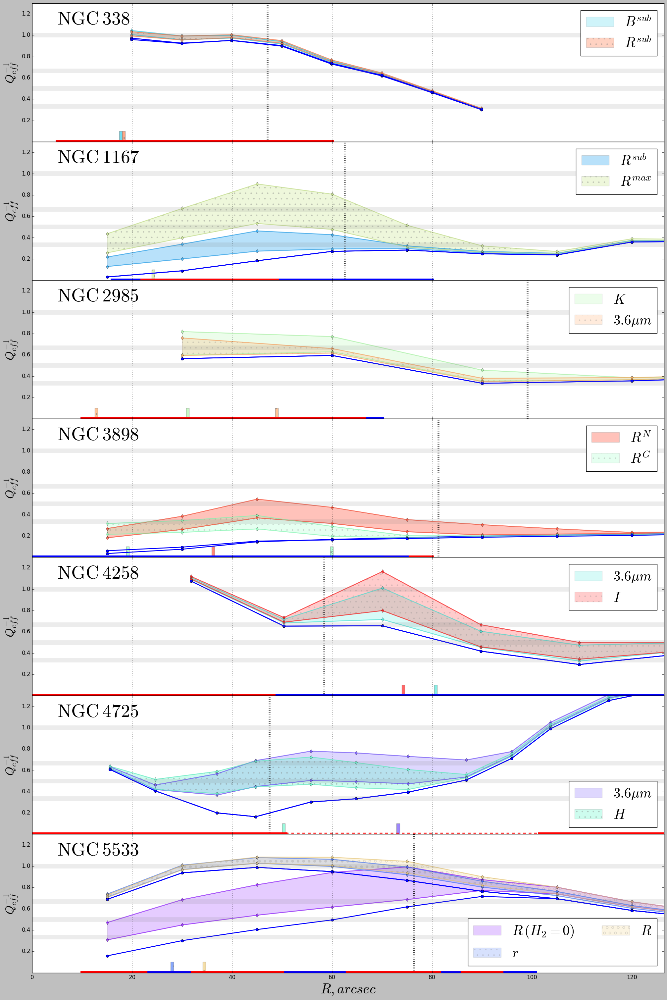

In [32]:
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQg, 'o-', color='b', lw=2)

    ax.set_ylim(0., 1.3)
    ax.set_xlim(0., data_lim+50.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    if name in ['NGC 5533', 'NGC 4725']:
        ax.legend(fontsize=30, loc='lower right')
    elif name == 'NGC 5533':
        ax.legend(fontsize=30, ncol=2)
    else:
        ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=7, figsize=[20., 30.], sharex=True)
for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
    if name == 'n5533':
        ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 6:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)
    
plt.savefig(paper_imgs_dir+'allQeff.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'allQeff.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'allQeff.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

Разбитая на две меньших картинки:

plot n338_modelB
plot n338_modelR
plot n5533_modelRzeroH2
plot n5533_modelr
plot n5533_modelRmax
plot n1167_modelRsubmax
plot n1167_modelRmax
plot n3898_modelRmax
plot n3898_modelR2dmax


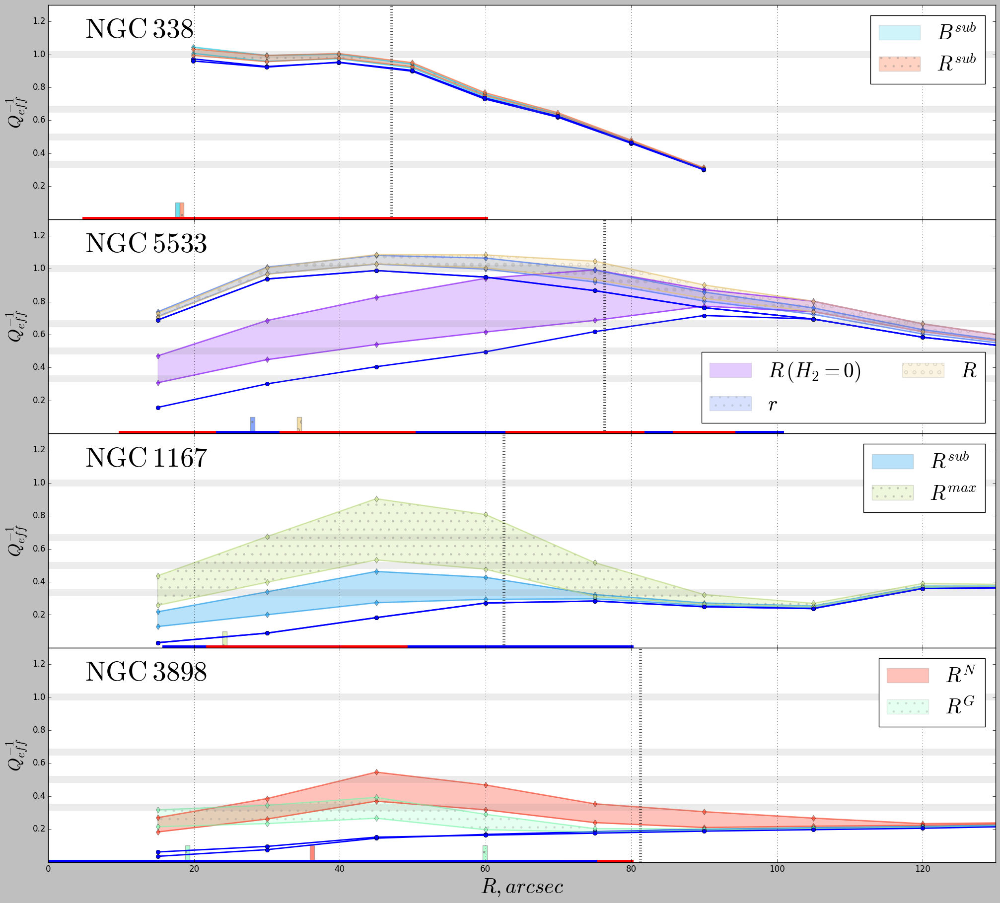

In [33]:
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQg, 'o-', color='b', lw=2)

    ax.set_ylim(0., 1.3)
    ax.set_xlim(0., 130.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    if name in ['NGC 5533', 'NGC 4725']:
        ax.legend(fontsize=30, loc='lower right')
    elif name == 'NGC 5533':
        ax.legend(fontsize=30, ncol=2)
    else:
        ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=4, figsize=[20., 18.], sharex=True)
for ind, name in enumerate(['n338', 'n5533', 'n1167', 'n3898']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
    if name == 'n5533':
        ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 3:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)
    
plt.savefig(paper_imgs_dir+'allQeff_p1.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'allQeff_p1.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'allQeff_p1.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

In [105]:
# import matplotlib as mpl; mpl.use("Cairo")
# import matplotlib.pylab as plt
# plt.switch_backend('Cairo') 

plot n2985_modelKmax
plot n2985_model36max
plot n4258_model36max
plot n4258_modelImax
plot n4725_model36max
plot n4725_modelHmax


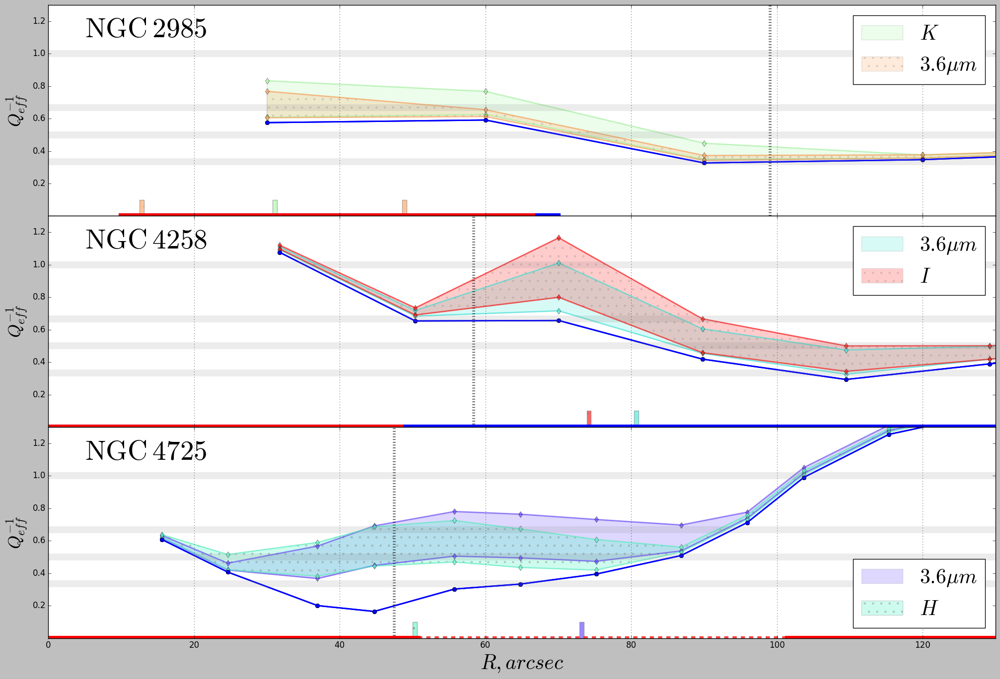

In [106]:
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQg, 'o-', color='b', lw=2)

    ax.set_ylim(0., 1.3)
    ax.set_xlim(0., 130.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    if name in ['NGC 5533', 'NGC 4725']:
        ax.legend(fontsize=30, loc='lower right')
    elif name == 'NGC 5533':
        ax.legend(fontsize=30, ncol=2)
    else:
        ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=3, figsize=[20., 13.5], sharex=True)
for ind, name in enumerate(['n2985', 'n4258', 'n4725']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
    if name == 'n5533':
        ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 2:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)


# ax.set_rasterized(True)

plt.savefig(paper_imgs_dir+'allQeff_p2.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'allQeff_p2.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'allQeff_p2.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

plot n338_modelB
plot n338_modelR
plot n5533_modelRzeroH2
plot n5533_modelr
plot n5533_modelRmax
plot n1167_modelRsubmax
plot n1167_modelRmax
plot n3898_modelRmax
plot n3898_modelR2dmax


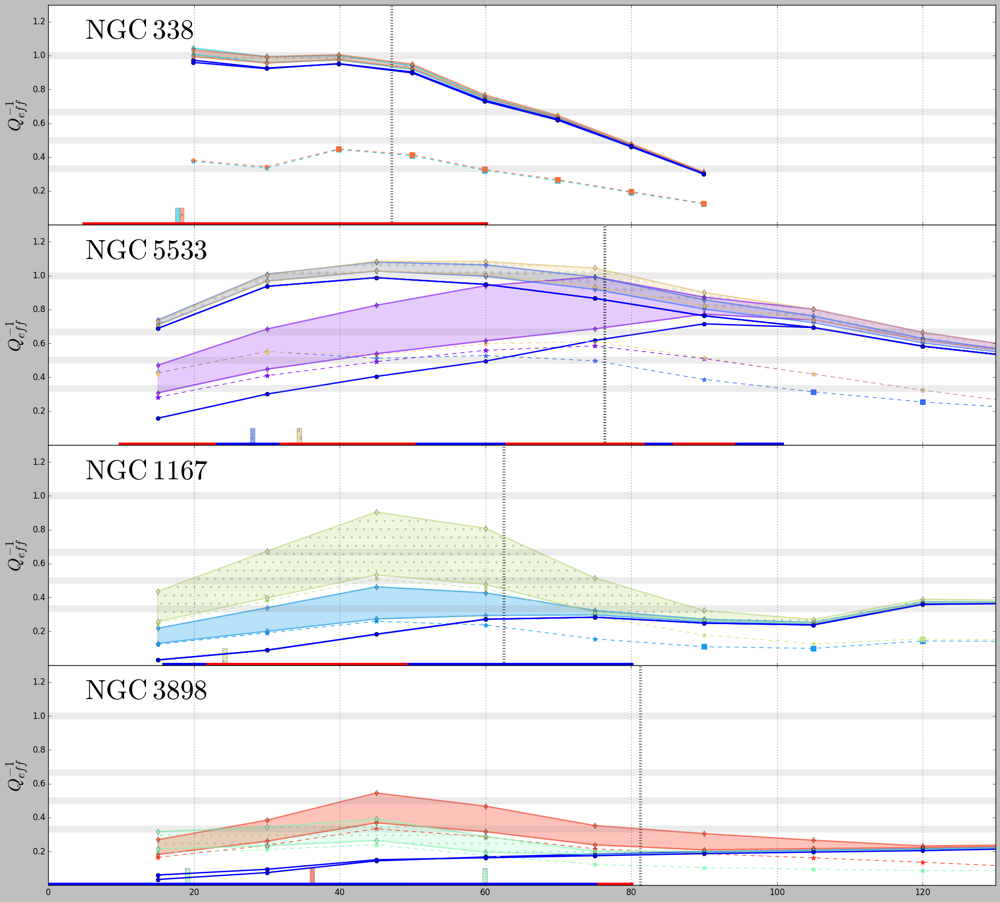

In [107]:
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQg, 'o-', color='b', lw=2)

    ax.set_ylim(0., 1.3)
    ax.set_xlim(0., 130.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
#     if name in ['NGC 5533', 'NGC 4725']:
#         ax.legend(fontsize=30, loc='lower right')
#     elif name == 'NGC 5533':
#         ax.legend(fontsize=30, ncol=2)
#     else:
#         ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=4, figsize=[20., 18.], sharex=True)
for ind, name in enumerate(['n338', 'n5533', 'n1167', 'n3898']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            ax.plot(model['r_g_dens'], model['fiducialQ'], '--', color=model['color'], label=model['label']+'_fiducial')
            for ind, comp in enumerate(model['mincomp']):
                if comp == 'star':
                    marker = '*'
                elif comp == 'HI':
                    marker = 's'
                elif comp == 'H2':
                    marker = 'd'
                ax.scatter(model['r_g_dens'][ind], model['fiducialQ'][ind], 50., marker=marker, color=model['color'])
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
#     if name == 'n5533':
#         ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 3:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)
    
# plt.savefig(paper_imgs_dir+'allQeff_p1.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p1.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p1.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

plot n338_modelB
plot n338_modelR
plot n5533_modelRzeroH2
plot n5533_modelr
plot n5533_modelRmax
plot n1167_modelRsubmax
plot n1167_modelRmax
plot n3898_modelRmax
plot n3898_modelR2dmax


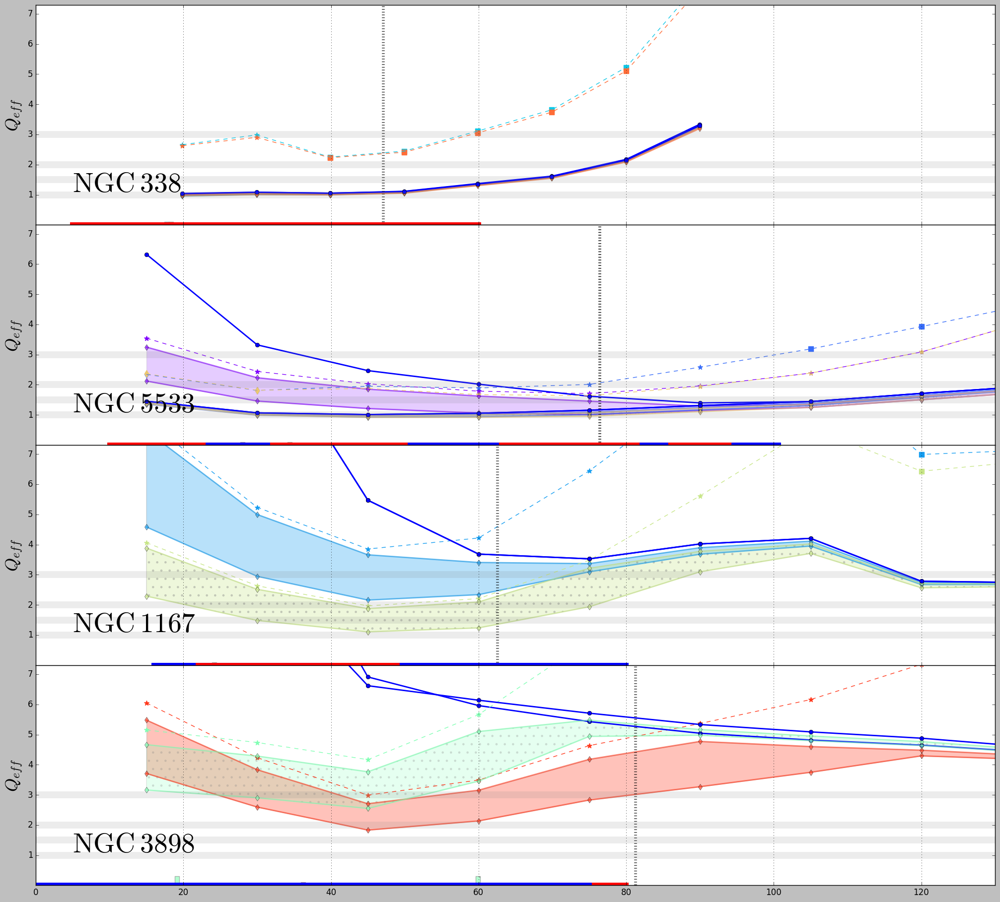

In [108]:
inverse = lambda l: 1./l
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    
    ax.fill_between(rr, map(inverse,invQeff_min), map(inverse,invQeff_max), color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, map(inverse, invQeff_min), 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, map(inverse, invQeff_max), 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, map(inverse, invQg), 'o-', color='b', lw=2)

    ax.set_ylim(0., 7.3)
    ax.set_xlim(0., 130.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.3, 0.3], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
#     if name in ['NGC 5533', 'NGC 4725']:
#         ax.legend(fontsize=30, loc='lower right')
#     elif name == 'NGC 5533':
#         ax.legend(fontsize=30, ncol=2)
#     else:
#         ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=4, figsize=[20., 18.], sharex=True)
for ind, name in enumerate(['n338', 'n5533', 'n1167', 'n3898']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            ax.plot(model['r_g_dens'], map(inverse,model['fiducialQ']), '--', color=model['color'], label=model['label']+'_fiducial')
            for ind, comp in enumerate(model['mincomp']):
                if comp == 'star':
                    marker = '*'
                elif comp == 'HI':
                    marker = 's'
                elif comp == 'H2':
                    marker = 'd'
                ax.scatter(model['r_g_dens'][ind], 1./model['fiducialQ'][ind], 50., marker=marker, color=model['color'])
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
#     if name == 'n5533':
#         ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 3:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)
    
# plt.savefig(paper_imgs_dir+'allQeff_p1.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p1.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p1.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

plot n2985_modelKmax
plot n2985_model36max
plot n4258_model36max
plot n4258_modelImax
plot n4725_model36max
plot n4725_modelHmax


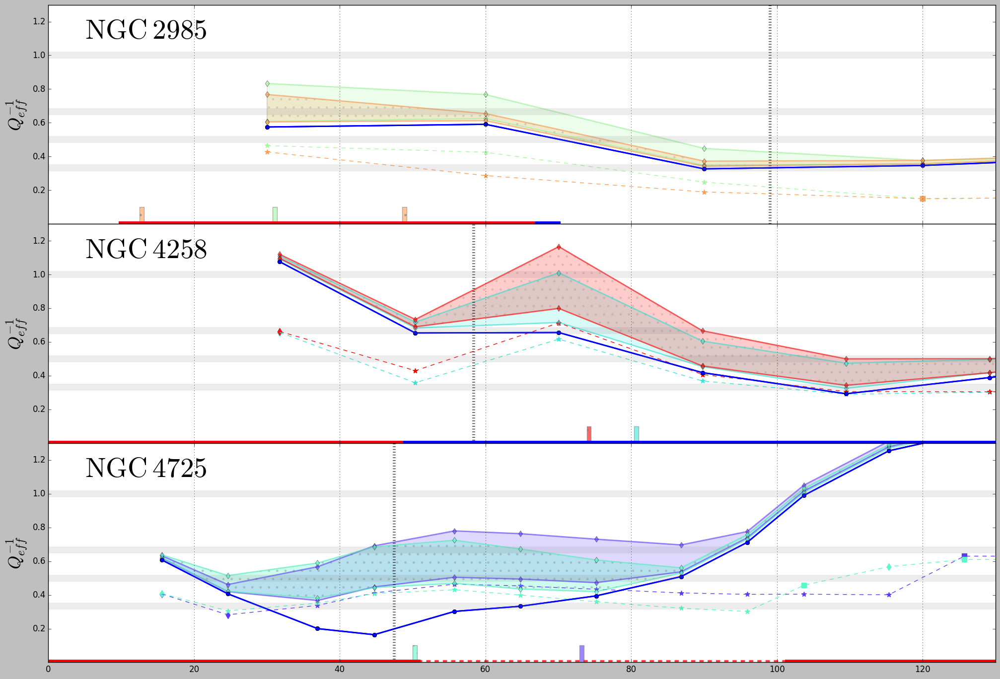

In [109]:
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQg, 'o-', color='b', lw=2)

    ax.set_ylim(0., 1.3)
    ax.set_xlim(0., 130.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
#     if name in ['NGC 5533', 'NGC 4725']:
#         ax.legend(fontsize=30, loc='lower right')
#     elif name == 'NGC 5533':
#         ax.legend(fontsize=30, ncol=2)
#     else:
#         ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=3, figsize=[20., 13.5], sharex=True)
for ind, name in enumerate(['n2985', 'n4258', 'n4725']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            ax.plot(model['r_g_dens'], model['fiducialQ'], '--', color=model['color'], label=model['label']+'_fiducial')
            for ind, comp in enumerate(model['mincomp']):
                if comp == 'star':
                    marker = '*'
                elif comp == 'HI':
                    marker = 's'
                elif comp == 'H2':
                    marker = 'd'
                ax.scatter(model['r_g_dens'][ind], model['fiducialQ'][ind], 50., marker=marker, color=model['color'])
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
#     if name == 'n5533':
#         ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 2:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)


# ax.set_rasterized(True)

# plt.savefig(paper_imgs_dir+'allQeff_p2.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p2.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p2.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

plot n2985_modelKmax
plot n2985_model36max
plot n4258_model36max
plot n4258_modelImax
plot n4725_model36max
plot n4725_modelHmax


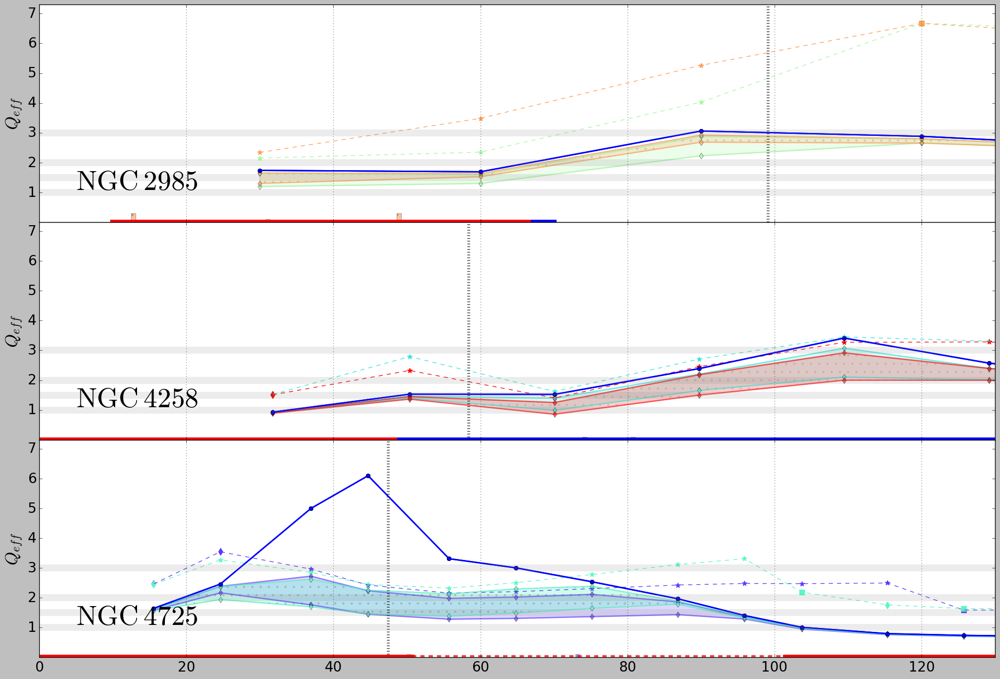

In [110]:
inverse = lambda l: 1./l
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    
    ax.fill_between(rr, map(inverse,invQeff_min), map(inverse,invQeff_max), color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, map(inverse, invQeff_min), 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, map(inverse, invQeff_max), 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, map(inverse, invQg), 'o-', color='b', lw=2)

    ax.set_ylim(0., 7.3)
    ax.set_xlim(0., 130.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.3, 0.3], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
#     if name in ['NGC 5533', 'NGC 4725']:
#         ax.legend(fontsize=30, loc='lower right')
#     elif name == 'NGC 5533':
#         ax.legend(fontsize=30, ncol=2)
#     else:
#         ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=3, figsize=[20., 13.5], sharex=True)
for ind, name in enumerate(['n2985', 'n4258', 'n4725']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            ax.plot(model['r_g_dens'], map(inverse,model['fiducialQ']), '--', color=model['color'], label=model['label']+'_fiducial')
            for ind, comp in enumerate(model['mincomp']):
                if comp == 'star':
                    marker = '*'
                elif comp == 'HI':
                    marker = 's'
                elif comp == 'H2':
                    marker = 'd'
                ax.scatter(model['r_g_dens'][ind], 1./model['fiducialQ'][ind], 50., marker=marker, color=model['color'])
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
#     if name == 'n5533':
#         ax.legend(fontsize=30, ncol=2, loc='lower right')
    
    if ind == 2:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    ax.tick_params(axis='both', which='major', labelsize=20)
    ax.tick_params(axis='both', which='minor', labelsize=8)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)


# ax.set_rasterized(True)

# plt.savefig(paper_imgs_dir+'allQeff_p2.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p2.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff_p2.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


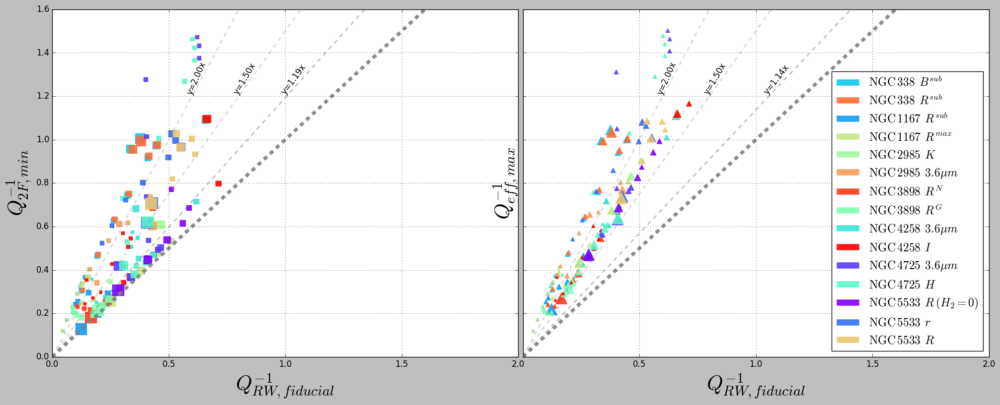

In [111]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
# for ind, name in enumerate(['n338']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            
            fiducialQ = model['fiducialQ']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.9
            
            ax.scatter(fiducialQ, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='s', color=color, alpha=alpha_)
            ax2.scatter(fiducialQ, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='^', color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F, min}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{RW, fiducial}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
ax2.set_ylabel(r'$Q_{eff, max}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW, fiducial}^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1.5, 2., 2):
       
#     line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
#     label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')
    
    line1, = ax.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line1, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.88), 1.2*0.88, 1.2, color='black')

T_07 = 1.05

line, = ax.plot([0., 1/T_07 * 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(T_07/0.88), 1.2*0.88/T_07, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


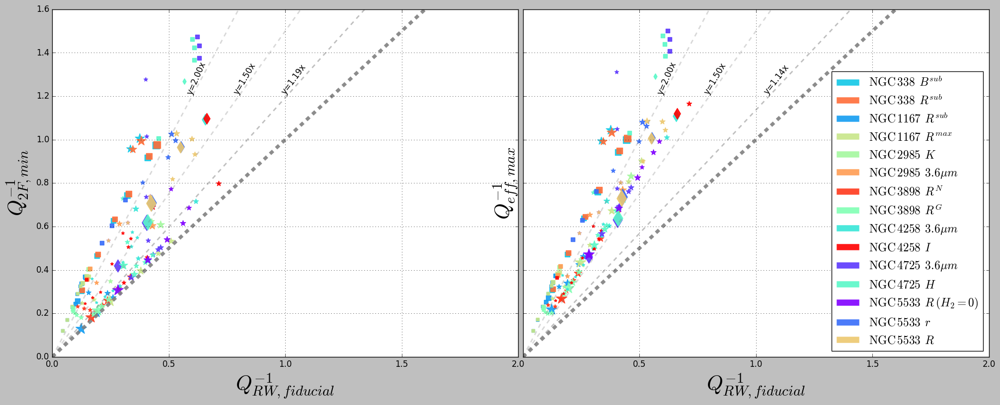

In [112]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
# for ind, name in enumerate(['n338']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            
            fiducialQ = model['fiducialQ']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.9
            
            for ind, comp in enumerate(model['mincomp']):
                if comp == 'star':
                    marker = '*'
                elif comp == 'HI':
                    marker = 's'
                elif comp == 'H2':
                    marker = 'd'
#                 ax.scatter(model['r_g_dens'][ind], model['fiducialQ'][ind], 50., marker=marker, color=model['color'])
                ax.scatter(fiducialQ[ind], invQeff_min[ind], 4000./model['total_gas_data'][ind][0], marker=marker, color=color, alpha=alpha_)
                ax2.scatter(fiducialQ[ind], invQeff_max[ind], 4000./model['total_gas_data'][ind][0], marker=marker, color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F, min}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{RW, fiducial}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
ax2.set_ylabel(r'$Q_{eff, max}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW, fiducial}^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1.5, 2., 2):
       
#     line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
#     label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')
    
    line1, = ax.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line1, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.88), 1.2*0.88, 1.2, color='black')

T_07 = 1.05

line, = ax.plot([0., 1/T_07 * 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(T_07/0.88), 1.2*0.88/T_07, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


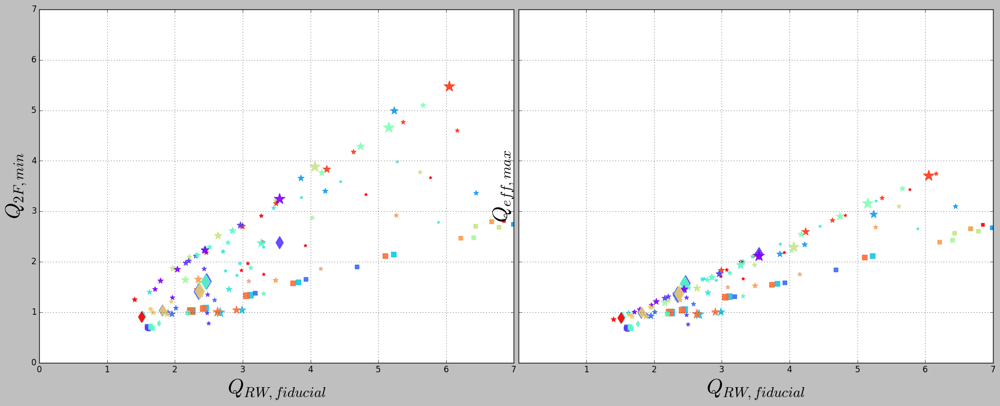

In [113]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

# ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
# ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
# for ind, name in enumerate(['n338']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            
            fiducialQ = model['fiducialQ']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            alpha_ = 0.9
            
            for ind, comp in enumerate(model['mincomp']):
                if comp == 'star':
                    marker = '*'
                elif comp == 'HI':
                    marker = 's'
                elif comp == 'H2':
                    marker = 'd'
#                 ax.scatter(model['r_g_dens'][ind], model['fiducialQ'][ind], 50., marker=marker, color=model['color'])
                ax.scatter(1./fiducialQ[ind], 1./invQeff_min[ind], 4000./model['total_gas_data'][ind][0], marker=marker, color=color, alpha=alpha_)
                ax2.scatter(1./fiducialQ[ind], 1./invQeff_max[ind], 4000./model['total_gas_data'][ind][0], marker=marker, color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\mathrm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 7.0)
ax.set_ylim(0, 7.0)
ax.set_ylabel(r'$Q_{2F, min}$', fontsize=30)
ax.set_xlabel(r'$Q_{RW, fiducial}$', fontsize=30)
ax.grid()

# ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 7.0)
ax2.set_ylim(0, 7.0)
ax2.set_ylabel(r'$Q_{eff, max}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RW, fiducial}$', fontsize=30)
ax2.grid()

# for _ in np.linspace(1.5, 2., 2):
       
# #     line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
# #     label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
#     line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
#     label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')
    
#     line1, = ax.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
#     label_line(line1, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

# line, = ax2.plot([0., 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
# label_line(line, 'y={:2.2f}x'.format(1./0.88), 1.2*0.88, 1.2, color='black')

# T_07 = 1.05

# line, = ax.plot([0., 1/T_07 * 0.88*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
# label_line(line, 'y={:2.2f}x'.format(T_07/0.88), 1.2*0.88/T_07, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'Qeff_vs_QRFh_vs_QRF11.pdf', format='pdf', dpi=150, bbox_inches='tight')

plt.show()

# Более плотная главная картинка

С нанесенными также другими моделями.

In [29]:
models_2 = {}
for model in os.listdir('models/'):
    if model[0].startswith('_'):
        print model
        models_2[model[:-4]] = np.load('models//'+model).tolist()

_1167_model_incl_max_Rmax.npy
_1167_model_incl_max_Rsubmax.npy
_1167_model_incl_min_Rmax.npy
_1167_model_incl_min_Rsubmax.npy
_338_model_other_H2.npy
_338_model_real_disp.npy


In [30]:
#workaround for bad model
models_2['_338_model_real_disp']['gas_approx'] = map(lambda l: float(l), models_2['_338_model_real_disp']['gas_approx'])

In [31]:
for ind, key in enumerate(models_2.keys()):
    print key
    model = models_2[key]
    Qgs, Qss, Qss_max, invQeff_min, invQeff_max, invQeff_WS_min, invQeff_WS_max = calc_Qs(**model)
    model['Qgs'] = Qgs
    model['Qss_min'] = Qss
    model['Qss_max'] = Qss_max
    model['invQeff_min'] = invQeff_min
    model['invQeff_max'] = invQeff_max
    model['invQeff_WS_min'] = invQeff_WS_min
    model['invQeff_WS_max'] = invQeff_WS_max

_1167_model_incl_max_Rsubmax
_1167_model_incl_min_Rmax
_1167_model_incl_min_Rsubmax
_1167_model_incl_max_Rmax
_338_model_other_H2
_338_model_real_disp


In [32]:
for ind, key in enumerate(models_2.keys()):
    print key
    model = models_2[key]
    model['band'] = 'None'

_1167_model_incl_max_Rsubmax
_1167_model_incl_min_Rmax
_1167_model_incl_min_Rsubmax
_1167_model_incl_max_Rmax
_338_model_other_H2
_338_model_real_disp


plot n338_modelB
plot n338_modelR
_338_model_other_H2
_338_model_real_disp
plot n1167_modelRsubmax
plot n1167_modelRmax
_1167_model_incl_max_Rsubmax
_1167_model_incl_min_Rmax
_1167_model_incl_min_Rsubmax
_1167_model_incl_max_Rmax
plot n2985_modelKmax
plot n2985_model36max
plot n3898_modelRmax
plot n3898_modelR2dmax
plot n4258_model36max
plot n4258_modelImax
plot n4725_model36max
plot n4725_modelHmax
plot n5533_modelRzeroH2
plot n5533_modelr
plot n5533_modelRmax


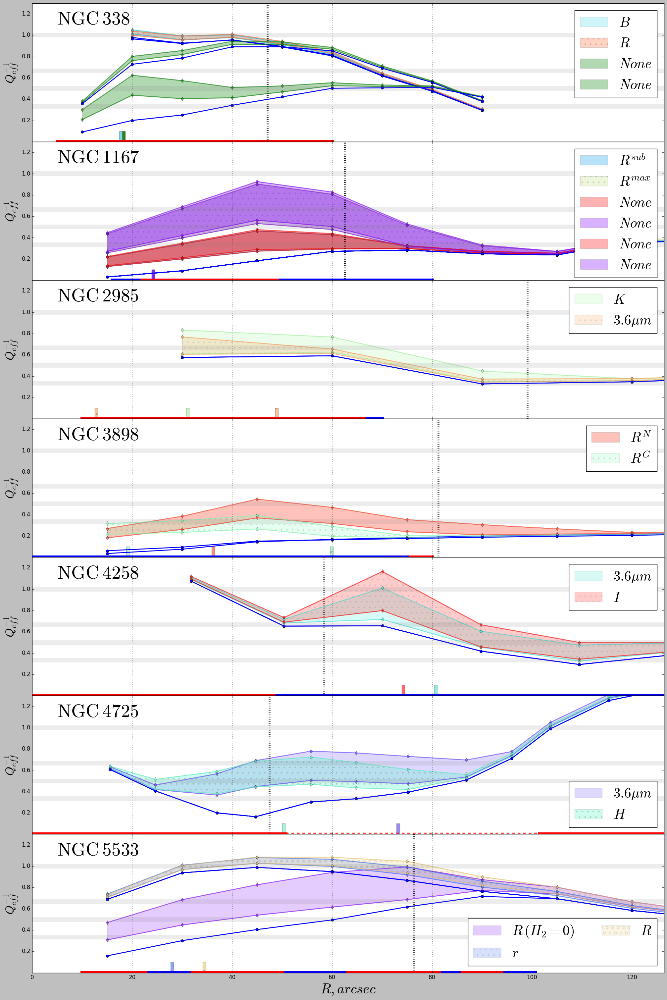

In [33]:
def plot_2f_vs_1f_(ax=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vel=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, band=None,
                  star_density_min=None, data_lim=None, color=None, alpha=0.4, disk_scales=[], label=None, name=None, invQeff_min=None, 
                   invQeff_max = None, Qgs = None, hatch=None,**kwargs):    
    
    rr = zip(*total_gas_data)[0]
    
    invQg = [1/_ for _ in Qgs]
    
    ax.fill_between(rr, invQeff_min, invQeff_max, color=color, alpha=alpha, label=r'$' + band + '$', hatch=hatch, edgecolor='grey')
    ax.plot(rr, invQeff_min, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQeff_max, 'd-', color=color, alpha=0.6, lw=2)
    ax.plot(rr, invQg, 'o-', color='b', lw=2)

    ax.set_ylim(0., 1.3)
    ax.set_xlim(0., data_lim+50.)
    ax.axvline(x=data_lim, ls=':', color='black', alpha=0.5, lw=4)
    if type(disk_scales) == list:
        for h in disk_scales:
            ax.fill_between([h-0.3, h+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    else:
        ax.fill_between([disk_scales-0.3, disk_scales+0.3], [0., 0.], [0.1, 0.1], color=color, alpha=0.6, hatch=hatch, edgecolor='grey')
    if name in ['NGC 5533', 'NGC 4725']:
        ax.legend(fontsize=30, loc='lower right')
    elif name == 'NGC 5533':
        ax.legend(fontsize=30, ncol=2)
    else:
        ax.legend(fontsize=30)
    ax.xaxis.grid(True)


fi, axes = plt.subplots(ncols=1, nrows=7, figsize=[20., 30.], sharex=True)
for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in models.keys():
        if name in key:
            model = models[key]
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            plot_2f_vs_1f_(ax, hatch=hatch, **model)
            SF[name](ax)
            count+=1
    ax.text(5, 1.1, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
    if name == 'n5533':
        ax.legend(fontsize=30, ncol=2, loc='lower right')
    if name == 'n1167':
        for key_ in models_2.keys():
            if '1167' in key_:
                print key_
                model = models_2[key_]
                plot_2f_vs_1f_(ax, hatch=None, **model)
    if name == 'n338':
        for key_ in models_2.keys():
            if '338' in key_:
                print key_
                model = models_2[key_]
                plot_2f_vs_1f_(ax, hatch=None, **model)
    
    if ind == 6:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)
    
# plt.savefig(paper_imgs_dir+'allQeff.eps', format='eps', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff.png', format='png', bbox_inches='tight')
# plt.savefig(paper_imgs_dir+'allQeff.pdf', format='pdf', dpi=150, bbox_inches='tight')
    
plt.show();

# Зависимость от $c_g$

In [ ]:
# n338_modelR
# n1167_modelRsubmax
# n2985_modelKmax
# n3898_modelRmax
# n4258_modelImax
# n4725_model36max
# n5533_modelr

In [36]:
# %%time
# def calc_c_dependence(N=None, total_gas_data=None, epicycl=None, gas_approx=None, sound_vels=None, scale=None, sigma_max=None, sigma_min=None, star_density_max=None, 
#                   star_density_min=None, data_lim=None, color=None, alpha=0.3, disk_scales=[], label=None, sfrange=None, Qss_min=None, Qss_max=None,  **kwargs):
    
#     rr = zip(*total_gas_data)[0]
    
#     result = []
#     for ind in range(N):
#         c = sound_vels[ind]
#         Qgs = []
#         invQeff_min = []
#         invQeff_max = []
#         for ind, (r, gd) in enumerate(total_gas_data):
#             Qgs.append(Qg(epicycl=epicycl[ind], sound_vel=c, gas_density=gd))
#             qeff = findInvKinemQeffBrentq(Qss_min[ind], Qgs[ind], c/sigma_max[ind], np.arange(0.01, 60000., 1.))
#             invQeff_min.append(qeff[1])
#             qeff = findInvKinemQeffBrentq(Qss_max[ind], Qgs[ind], c/sigma_min[ind], np.arange(0.01, 60000., 1.))
#             invQeff_max.append(qeff[1])
#         result.append((invQeff_min, invQeff_max))
        
#     qmins = []
#     qmaxs = []
#     for ind, rrr in enumerate(rr):
#         qmin = [result[l][0][ind] for l in range(len(result))]
#         qmax = [result[l][1][ind] for l in range(len(result))]
#         qmins.append((np.mean(qmin), np.std(qmin)))
#         qmaxs.append((np.mean(qmax), np.std(qmax)))
    
#     return qmins, qmaxs

# # TODO: recalculate for all
# for ind, key in enumerate(models.keys()):
#     print key
#     model = models[key]
#     model['Qc_min'], model['Qc_max'] = calc_c_dependence(sound_vels=list(np.linspace(4., 20., 20)), N=20, **model)

n1167_modelRsubmax
Wall time: 7min 30s


In [134]:
# %%time
# for key in ['n338_modelR', 'n1167_modelRsubmax', 'n2985_modelKmax', 'n3898_modelRmax', 'n4258_modelImax', 'n4725_model36max', 'n5533_modelr']:
#     print key
#     model = models[key]
#     model['Qc_min'], model['Qc_max'] = calc_c_dependence(sound_vels=list(np.linspace(4., 20., 20)), N=20, **model)

n338_modelR
n1167_modelRsubmax
n2985_modelKmax
n3898_modelRmax
n4258_modelImax
n4725_model36max
n5533_modelr
Wall time: 39min 47s


In [37]:
# np.save('models_wth_c3.npy', models)

In [38]:
models = np.load('models_wth_c3.npy').all()

In [39]:
for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            models[key]['name'] = 'NGC '+name[1:]
            models[key]['band'] = models[key]['label'].split(' ')[0]
            if name == 'n1167':
                if key == 'n1167_modelRsubmax':
                    models[key]['band'] = 'R^{sub}'
                else:
                    models[key]['band'] = 'R^{max}'
            if key == 'n5533_modelr':
                models[key]['band'] = 'r'
            if key == 'n3898_modelRmax':
                models[key]['band'] = 'R^{N}'
            if key == 'n3898_modelR2dmax':
                models[key]['band'] = 'R^{G}'
            if models[key]['band'] in ['S4G', 'SPITZER']:
                models[key]['band'] = '3.6\mu m'
            if key == 'n5533_modelRzeroH2':
                models[key]['band'] = 'R\,(H_2=0)'

In [40]:
models['n338_modelR']

{'CO': [8.1691142483221633,
  4.7299394465538596,
  2.7386478494484567,
  1.5856845796943859,
  0.91811569960955075,
  0.53159149597834709,
  0.30779292709696021,
  0.17821294487896283],
 'CO_gas_dens': [8.1691142483221633,
  4.7299394465538596,
  2.7386478494484567,
  1.5856845796943859,
  0.91811569960955075,
  0.53159149597834709,
  0.30779292709696021,
  0.17821294487896283],
 'HI_gas_dens': [10.599999999999998,
  9.0999999999999979,
  7.4000000000000004,
  5.3000000000000007,
  4.2999999999999998,
  2.8999999999999999,
  2.0,
  1.1000000000000001],
 'ML': 9.64,
 'Qc_max': [(0.78843519138434714, 0.23360841837333529),
  (0.73891087101710895, 0.23171652571696641),
  (0.70775869628423327, 0.26609639121115175),
  (0.65497539173597974, 0.25286615877993029),
  (0.56971996019432125, 0.23963231522783102),
  (0.43037404757899989, 0.18655890368680064),
  (0.32566113639153654, 0.14539669390610274),
  (0.20380616033922649, 0.090251697410709833)],
 'Qc_min': [(0.67436066634270952, 0.28371353222

In [41]:
print sorted(models['n338_modelR'].keys())

['CO', 'CO_gas_dens', 'HI_gas_dens', 'ML', 'Qc_max', 'Qc_min', 'Qgs', 'Qss_max', 'Qss_min', 'alpha', 'band', 'color', 'data_lim', 'disk_scales', 'epicycl', 'gas_approx', 'invQeff_WS_max', 'invQeff_WS_min', 'invQeff_max', 'invQeff_min', 'label', 'name', 'r_g_dens', 'romeo_max', 'romeo_max_11', 'romeo_max_h', 'romeo_min', 'romeo_min_11', 'romeo_min_h', 'scale', 'sigma_R_max', 'sigma_R_min', 'sigma_max', 'sigma_min', 'sound_vel', 'sound_vel_CO', 'sound_vel_HI', 'star_density', 'star_density_max', 'star_density_min', 'total_gas_data']


Картинка:

plot n338_modelR
plot n1167_modelRsubmax
plot n2985_modelKmax
plot n3898_modelRmax
plot n4258_modelImax
plot n4725_model36max
plot n5533_modelr


C:\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


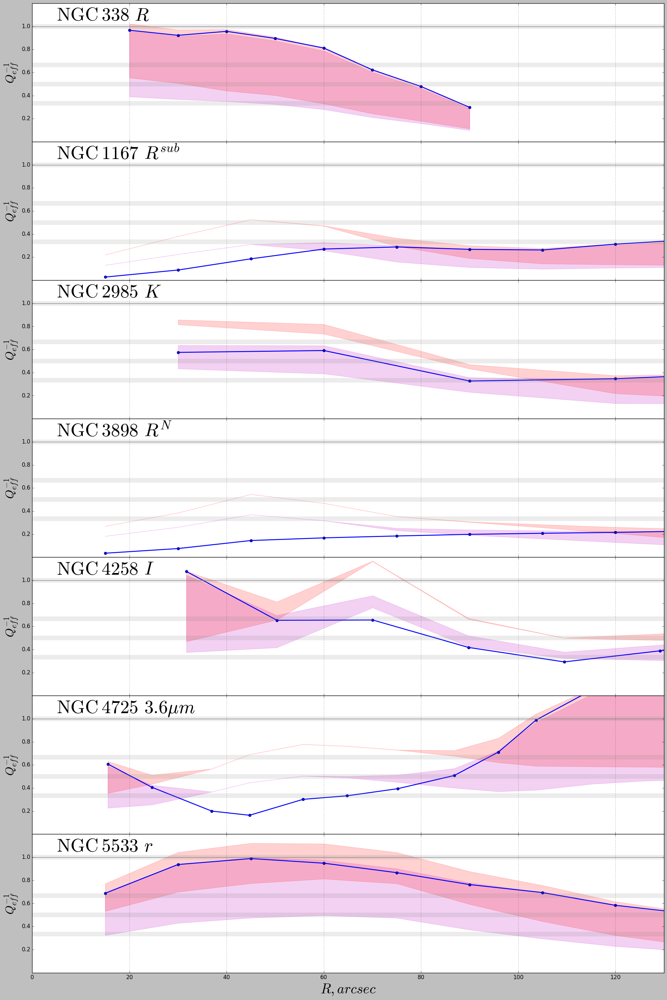

In [41]:
fig, axes = plt.subplots(ncols=1, nrows=7, figsize=[20., 30.], sharex=True)
for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    ax = axes[ind]
    count = 0
    hatch = None
    for key in ['n338_modelR', 'n1167_modelRsubmax', 'n2985_modelKmax', 'n3898_modelRmax', 'n4258_modelImax', 'n4725_model36max', 'n5533_modelr']:
#     for key in models.keys():
        if name in key:
            model = models[key]
            if count > 0:
                hatch = [None, '.', 'o'][count]
            print 'plot {}'.format(key)
            qmins, qmaxs = model['Qc_min'], model['Qc_max']
            rr = model['r_g_dens']
#             ax.errorbar(rr, zip(*qmins)[0], fmt='o-', yerr=zip(*qmins)[1], elinewidth=6, alpha=0.3, label=r'$' + model['band'] + '$');
#             ax.errorbar(rr, zip(*qmaxs)[0], fmt='o-', yerr=zip(*qmaxs)[1])
            mean_val = np.array(zip(*qmins)[0])
            std_val = np.array(zip(*qmins)[1])
            ax.fill_between(rr, mean_val+std_val, mean_val-std_val, color='m', alpha=0.18)
            mean_val = np.array(zip(*qmaxs)[0])
            std_val = np.array(zip(*qmaxs)[1])
            ax.fill_between(rr, mean_val+std_val, mean_val-std_val, color='r', alpha=0.18)
            ax.plot(rr, map(lambda l: 1/l,model['Qgs']), 'o-', color='b', lw=2)
            ax.axhline(y=1., ls='-', color='grey')
#             SF[name](ax)
            count+=1
            ax.legend(fontsize=30)
            ax.set_ylim(0., 1.2)
            ax.grid(axis='x')
    ax.text(5, 1.05, r'$\rm{NGC\:'+name[1:]+'}}$', fontsize=40)
    ax.set_xlim(0, 130.)
    if name == 'n338':
        ax.text(21, 1.05, r'$'+model['band']+'$', fontsize=40)
    else:
        ax.text(23, 1.05, r'$'+model['band']+'$', fontsize=40)
    
    if ind == 6:
        ax.set_xlabel(r'$R, arcsec$', fontsize=30)
    ax.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=25)
    for q_ in [1., 1.5, 2., 3.]:
        ax.axhline(y=1./q_, lw=10, alpha=0.15, color='grey')
#     ax.set_yticks(['', '0.2', '0.4', '0.6', '0.8', '1.0', ''])
    plt.setp(ax.get_yticklabels()[0], visible=False)
    plt.setp(ax.get_yticklabels()[-1], visible=False)
    
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.0)
# fig.subplots_adjust(wspace=0.01, hspace=0.02)
    
plt.savefig(paper_imgs_dir+'cg_depend.eps', format='eps', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'cg_depend.png', format='png', bbox_inches='tight')
plt.savefig(paper_imgs_dir+'cg_depend.pdf', format='pdf', dpi=150, bbox_inches='tight')
plt.show();

# Почему $Q^{-1}_{2F} = 1.135 Q^{-1}_{RW}$

In [32]:
for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    model['r_g_dens'] = zip(*model['total_gas_data'])[0]
    model['HI_gas_dens'] = [l[0][1]/He_coeff - l[1] for l in zip(model['total_gas_data'], model['CO'])]
    model['CO_gas_dens'] = model['CO']
    model['star_density'] = model['star_density_min']
    model['sigma_R_max'] = model['sigma_max']
    model['sigma_R_min'] = model['sigma_min']
    model['sound_vel_CO'] = model['sound_vel']
    model['sound_vel_HI'] = model['sound_vel']

n5533_modelRzeroH2
n4725_model36max
n5533_modelr
n1167_modelRsubmax
n338_modelB
n3898_modelRmax
n4725_modelHmax
n3898_modelR2dmax
n2985_modelKmax
n1167_modelRmax
n5533_modelRmax
n2985_model36max
n338_modelR
n4258_model36max
n4258_modelImax


In [38]:
from math import pi

def romeo_Qinv(r=None, epicycl=None, sound_vel_CO=6., sound_vel_HI=6., sigma_R=None, star_density=None, 
               HI_density=None, CO_density=None, alpha=None, scale=None, gas_approx=None, verbose=False, show=False, thin=True):
    
    G = 4.32
    kappa = epicycl
    Q_star = kappa*sigma_R/(pi*G*star_density)
    Q_CO = kappa*sound_vel_CO/(pi*G*CO_density)
    Q_HI = kappa*sound_vel_HI/(pi*G*HI_density)
    if not thin:
        T_CO, T_HI = 1.5, 1.5
        if alpha > 0 and alpha <= 0.5:
            T_star = 1. + 0.6*alpha**2
        else:
            T_star = 0.8 + 0.7*alpha
    else:
        T_CO, T_HI, T_star = 1., 1., 1.
    dispersions = [sigma_R, sound_vel_HI, sound_vel_CO]
    QTs = [Q_star*T_star, Q_HI*T_HI, Q_CO*T_CO]
    components = ['star', 'HI', 'H2']
    index = QTs.index(min(QTs))
    sig_m = dispersions[index]
    def W_i(sig_m, sig_i):
        return 2*sig_m*sig_i/(sig_m**2 + sig_i**2)
    print index, components[index]
    print 'Ws/Qs={:5.3f} WHI/QHI={:5.3f} WCO/QCO={:5.3f}'.format(W_i(sig_m, dispersions[0])/QTs[0], W_i(sig_m, dispersions[1])/QTs[1], W_i(sig_m, dispersions[2])/QTs[2])
    print 'Ws={:5.3f} WHI={:5.3f} WCO={:5.3f}'.format(W_i(sig_m, dispersions[0]), W_i(sig_m, dispersions[1]), W_i(sig_m, dispersions[2]))
    
    Qg_ = Qg(epicycl=epicycl, sound_vel=sound_vel_CO, gas_density=(CO_density + HI_density))
    Qs_ = Qs(epicycl=epicycl, sigma=sigma_R, star_density=star_density)
    qeff = findInvKinemQeffBrentq(Qs_, Qg_, sound_vel_CO/sigma_R, np.arange(0.01, 60000., 1.))
    s = sound_vel_CO/sigma_R
    print 'Qg = {:5.3f} Qs={:5.3f} Qeff={:5.3f} Qfee/QR = {:5.3f} {:5.3f} {:5.3f} {:5.3f}'.format(1./Qg_, 1./Qs_, qeff[1], (qeff[1]/(W_i(sig_m, dispersions[0])/QTs[0] + 
                                                                                                             W_i(sig_m, dispersions[1])/QTs[1] + W_i(sig_m, dispersions[2])/QTs[2])),
                                                                                 (Qs_*(2*s/((1+s**2)))/(Qg_*1.068)), 2*s/((1+s**2)*Qg_), 2. * (1 - i0e(1.)))
    
    return W_i(sig_m, dispersions[0])/QTs[0] + W_i(sig_m, dispersions[1])/QTs[1] + W_i(sig_m, dispersions[2])/QTs[2], components[index]

def calc_romeo_Q(r_g_dens=None, HI_gas_dens=None, CO_gas_dens=None, epicycl=None, sound_vel_CO=6., sound_vel_HI=11., sigma_R_max=None, sigma_R_min=None,  
           star_density=None, alpha_max=None, alpha_min=None, scale=None, gas_approx=None, thin=True, show=False, color=None, **kwargs):    
            
    totgas = zip(r_g_dens, [He_coeff*(l[0]+l[1]) for l in zip(HI_gas_dens, CO_gas_dens)])

    romeo_min = []
    components_min = []
    for ind, (r, g, co) in enumerate(zip(r_g_dens, HI_gas_dens, CO_gas_dens)):
        rom, _ = romeo_Qinv(r=r, epicycl=epicycl[ind], sound_vel_CO=sound_vel_CO, sound_vel_HI=sound_vel_HI, sigma_R=sigma_R_max[ind], 
               star_density=star_density[ind], HI_density=He_coeff*g, CO_density=He_coeff*co, alpha=alpha_min, scale=scale, gas_approx=gas_approx[ind], thin=thin)
        romeo_min.append(rom)
        components_min.append(_)

    
    romeo_max = []
    components_max = []
    for ind, (r, g, co) in enumerate(zip(r_g_dens, HI_gas_dens, CO_gas_dens)):
        rom, _ = romeo_Qinv(r=r, epicycl=epicycl[ind], sound_vel_CO=sound_vel_CO, sound_vel_HI=sound_vel_HI, sigma_R=sigma_R_min[ind], 
               star_density=star_density[ind], HI_density=He_coeff*g, CO_density=He_coeff*co, alpha=alpha_max, scale=scale, gas_approx=gas_approx[ind], thin=thin)
        romeo_max.append(rom)
        components_max.append(_)
    
    return romeo_min, romeo_max, components_min, components_max


for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    romeo_min, romeo_max, components_min, components_max = calc_romeo_Q(alpha_max=0.7, alpha_min=0.3, thin=True, **model)
    model['romeo_min'] = romeo_min
    model['romeo_max'] = romeo_max
    model['components_min'] = components_min
    model['components_max'] = components_max

n5533_modelRzeroH2
0 star
Ws/Qs=0.261 WHI/QHI=0.010 WCO/QCO=0.000
Ws=1.000 WHI=0.064 WCO=0.064
Qg = 0.158 Qs=0.279 Qeff=0.308 Qfee/QR = 1.137 0.034 0.010 1.068
0 star
Ws/Qs=0.373 WHI/QHI=0.021 WCO/QCO=0.000
Ws=1.000 WHI=0.071 WCO=0.071
Qg = 0.301 Qs=0.399 Qeff=0.448 Qfee/QR = 1.135 0.050 0.022 1.068
0 star
Ws/Qs=0.442 WHI/QHI=0.034 WCO/QCO=0.000
Ws=1.000 WHI=0.085 WCO=0.085
Qg = 0.405 Qs=0.472 Qeff=0.540 Qfee/QR = 1.133 0.068 0.035 1.068
1 HI
Ws/Qs=0.052 WHI/QHI=0.494 WCO/QCO=0.001
Ws=0.105 WHI=1.000 WCO=1.000
Qg = 0.495 Qs=0.527 Qeff=0.616 Qfee/QR = 1.125 0.093 0.052 1.068
1 HI
Ws/Qs=0.062 WHI/QHI=0.616 WCO/QCO=0.002
Ws=0.124 WHI=1.000 WCO=1.000
Qg = 0.618 Qs=0.534 Qeff=0.686 Qfee/QR = 1.010 0.134 0.076 1.068
1 HI
Ws/Qs=0.052 WHI/QHI=0.714 WCO/QCO=0.002
Ws=0.125 WHI=1.000 WCO=1.000
Qg = 0.716 Qs=0.447 Qeff=0.772 Qfee/QR = 1.006 0.187 0.089 1.068
1 HI
Ws/Qs=0.042 WHI/QHI=0.691 WCO/QCO=0.003
Ws=0.125 WHI=1.000 WCO=1.000
Qg = 0.694 Qs=0.356 Qeff=0.739 Qfee/QR = 1.005 0.228 0.087 1.068
1 

In [47]:
ratio = []
for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    romeo_min, romeo_max, components_min, components_max = model['romeo_min'], model['romeo_max'], model['components_min'], model['components_max']
    invQeff_min, invQeff_max = model['invQeff_min'], model['invQeff_max']
    for ind_, component in enumerate(components_min):
        if component == 'star':
            ratio.append(invQeff_min[ind_]/romeo_min[ind_])
            
    for ind_, component in enumerate(components_max):
        if component == 'star':
            ratio.append(invQeff_max[ind_]/romeo_max[ind_])

n5533_modelRzeroH2
n4725_model36max
n5533_modelr
n1167_modelRsubmax
n338_modelB
n3898_modelRmax
n4725_modelHmax
n3898_modelR2dmax
n2985_modelKmax
n1167_modelRmax
n5533_modelRmax
n2985_model36max
n338_modelR
n4258_model36max
n4258_modelImax


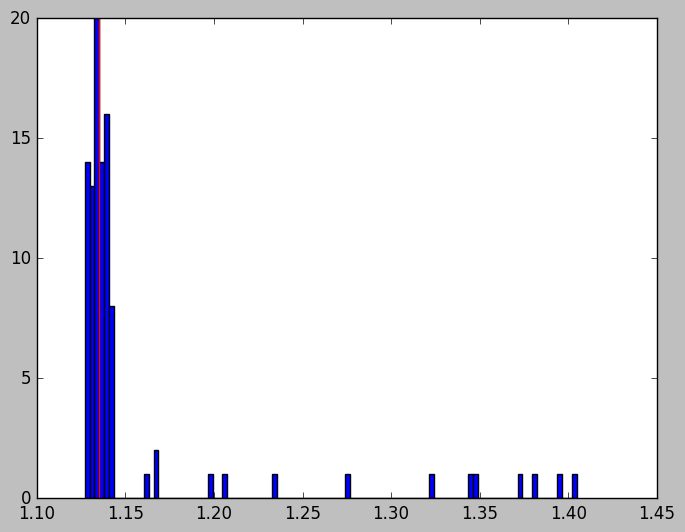

In [49]:
plt.hist(ratio, bins=100)
plt.axvline(x=1.135, color='r');

In [55]:
ratio = []
for ind, key in enumerate(models.keys()):
    print key
    model = models[key]
    romeo_min, romeo_max, components_min, components_max = model['romeo_min'], model['romeo_max'], model['components_min'], model['components_max']
    invQeff_min, invQeff_max = model['invQeff_min'], model['invQeff_max']
    
    for ind_, component in enumerate(components_min):
        if component == 'star':
            s = model['sound_vel']/model['sigma_R_max'][ind_]
            ratio.append((2*s/(1+s**2))*model['Qss_max'][ind_]/(model['Qgs'][ind_]*3.36))
            
    for ind_, component in enumerate(components_max):
        if component == 'star':
            s = model['sound_vel']/model['sigma_R_min'][ind_]
            ratio.append((2*s/(1+s**2))*model['Qss_min'][ind_]/(model['Qgs'][ind_]*3.36))

n5533_modelRzeroH2
n4725_model36max
n5533_modelr
n1167_modelRsubmax
n338_modelB
n3898_modelRmax
n4725_modelHmax
n3898_modelR2dmax
n2985_modelKmax
n1167_modelRmax
n5533_modelRmax
n2985_model36max
n338_modelR
n4258_model36max
n4258_modelImax


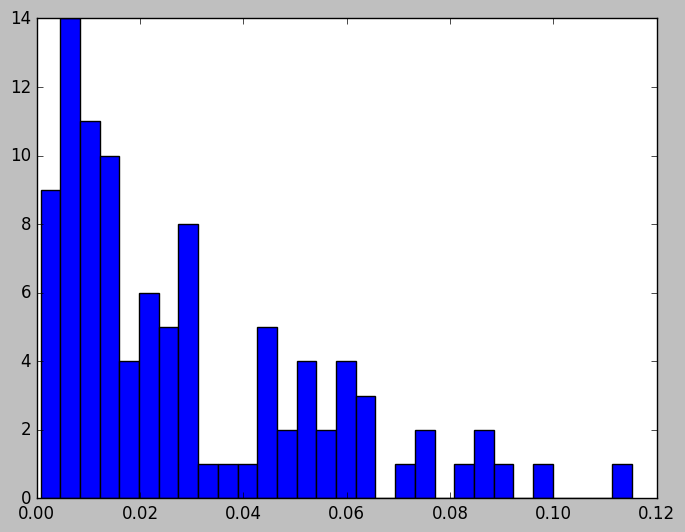

In [57]:
plt.hist(ratio, bins=30);
# plt.axvline(x=1.135, color='r');

n338_modelB
n338_modelR
n1167_modelRsubmax
n1167_modelRmax
n2985_modelKmax
n2985_model36max
n3898_modelRmax
n3898_modelR2dmax
n4258_model36max
n4258_modelImax
n4725_model36max
n4725_modelHmax
n5533_modelRzeroH2
n5533_modelr
n5533_modelRmax


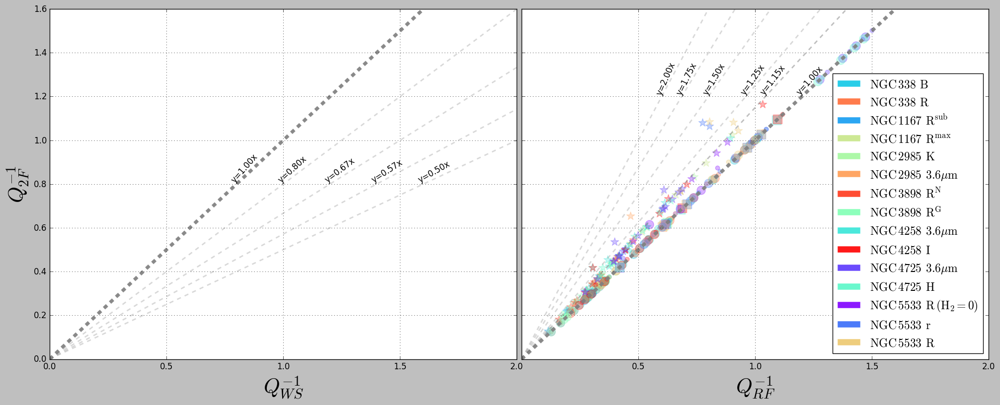

In [79]:
fig, (ax, ax2) = plt.subplots(ncols=2, nrows=1, figsize=[20, 8], sharey=True)

ax.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)
ax2.plot([0., 2.0], [0., 2.0], '--', alpha=0.9, color='gray', lw=5)

for ind, name in enumerate(['n338', 'n1167', 'n2985', 'n3898', 'n4258', 'n4725', 'n5533']):
    for key in models.keys():
        if name in key:
            print key
            model = models[key]
            color = model['color']
            romeo_min = model['romeo_min']
            romeo_max = model['romeo_max']
            
            invQwff_WS_min = model['invQeff_WS_min']
            invQwff_WS_max = model['invQeff_WS_max']
            
            invQeff_min = model['invQeff_min']
            invQeff_max = model['invQeff_max']
            
            components_min = model['components_min']
            components_max = model['components_max']
            
            alpha_ = 0.9
            for ind_ in range(len(romeo_min)):
                marker = '*' if components_min[ind_] == 'star' else '.'
                ax2.scatter(romeo_min[ind_], invQeff_min[ind_], 150., marker=marker, color=color, alpha=0.3)
                marker = '*' if components_max[ind_] == 'star' else '.'
                ax2.scatter(romeo_max[ind_], invQeff_max[ind_], 150., marker=marker, color=color, alpha=0.3)
#             ax.scatter(invQwff_WS_min, invQeff_min, map(lambda l: 4000./l[0], model['total_gas_data']), marker='^', color=color, alpha=alpha_)
#             ax.scatter(invQwff_WS_max, invQeff_max, map(lambda l: 4000./l[0], model['total_gas_data']), marker='D', color=color, alpha=alpha_)
            
            ax.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\rm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_)
            ax2.plot([-1, -2], [-1, -2], '-', color=color, label=r'$\rm{NGC\, '+name[1:]+'}\:\: ' + model['band'] + '$', lw=9, alpha=alpha_ )
            
# ax.legend(loc='lower right')
ax.set_xlim(0, 2.0)
ax.set_ylim(0, 1.6)
ax.set_ylabel(r'$Q_{2F}^{-1}$', fontsize=30)
ax.set_xlabel(r'$Q_{WS}^{-1}$', fontsize=30)
ax.grid()

ax2.legend(loc='lower right', fontsize=17)
ax2.set_xlim(0, 2.0)
ax2.set_ylim(0, 1.6)
# ax2.set_ylabel(r'$Q_{eff}^{-1}$', fontsize=30)
ax2.set_xlabel(r'$Q_{RF}^{-1}$', fontsize=30)
ax2.grid()

for _ in np.linspace(1., 2., 5):
       
    line, = ax.plot([0., _*2], [0., 2.0], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line, 'y={:2.2f}x'.format(1./_), 0.8*_, 0.8, color='black')
    
    line2, = ax2.plot([0., 2.0], [0., _*2], '--', alpha=0.3, color='gray', lw=2.)
    label_line(line2, 'y={:2.2f}x'.format(_), 1.2/_, 1.2, color='black')

line, = ax2.plot([0., 0.87*2], [0., 2.0], '--', alpha=0.5, color='gray', lw=2.)
label_line(line, 'y={:2.2f}x'.format(1./0.87), 1.2*0.87, 1.2, color='black')


plt.setp(ax2.get_xticklabels()[0], visible=False)

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
fig.subplots_adjust(wspace=0.01, hspace=0.02)

plt.show()